# Predicting United States County Poverty Rates Through The Microsoft Capstone Project

The goal of this project is to predict accurately the poverty rate of United Sates counties. Predicting the value of a quantitative variable is a regression problem. The CRISP-DM Methodology was used to tackle this regression problem:

* Understand and explore the data
* Clean and transform the data
* Create a model
* Evaluate the model
* Deploying the model is not applicable to this project; or we could say that the creation of this report or the presentation of our findings counts as the deployment of this model.

## Understand Data
"Concentrated poverty contributes to poor housing and health conditions, higher crime and school dropout rates, as well as employment dislocations."
With this information we will try to construct features around poor housing, health conditions, higher crime and school drop out rates based on the data we have.


An important dimension of poverty is time. An area that has a high level of poverty this year, but not next year, is likely better off than an area that has a high level of poverty in both years. It will be hard to construct a feature of this because we cannot compare the state's poverty rate over year 'a' and 'b' with this data set.
https://www.ers.usda.gov/topics/rural-economy-population/rural-poverty-well-being/geography-of-poverty/

There is more poverty in Non-Metro areas than Metro areas. Poverty is also higher under certain ages and etnicities. Here also we will try to construct features out of this information.

## Regression Model

Using nested cross validation the best scoring regressor is a Ridge Linear Regression model:
* RMSE: .....
* R2: ....

The most significant features used in building this model are the following:
* feature 1
* feature 2
* feature 3

## Data Exploration
In order to build this model and determine the most significant features for this regression model a thorough data exploration was done to understand the relationship between poverty rates and other features.

In [523]:
import re
import bs4
import time
import plyfile
import html5lib
import multiprocessing

import numpy as np
import pandas as pd

from scipy import misc
import scipy.io.wavfile as wavfile

import scipy
from math import sqrt
from scipy import stats
from pprint import pprint
from sklearn import tree
from sklearn.svm import SVC
from sklearn import manifold
from tempfile import mkdtemp
from matplotlib import cm as cm


import sklearn.metrics as metrics
from pandas.plotting import scatter_matrix
from scipy.stats import randint as sp_randint
from sklearn.pipeline import TransformerMixin
from sklearn.metrics.scorer import make_scorer
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.datasets import load_iris
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import Binarizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsClassifier
from sklearn.feature_selection import RFECV, SelectFromModel
from sklearn.ensemble import RandomForestClassifier, AdaBoostRegressor
from sklearn.dummy import DummyClassifier, DummyRegressor
from sklearn.cluster import AgglomerativeClustering, KMeans
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.linear_model import LinearRegression, LassoCV, RidgeCV, Lasso, Ridge
from sklearn.preprocessing import MaxAbsScaler, MinMaxScaler, Normalizer, RobustScaler, StandardScaler
from sklearn.metrics import recall_score, accuracy_score, confusion_matrix, roc_curve, roc_auc_score, mean_squared_error
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV, cross_val_score, cross_validate, cross_val_predict, KFold, ShuffleSplit

import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm as cm
from mpl_toolkits.mplot3d import Axes3D
from pandas.plotting import parallel_coordinates, andrews_curves

%matplotlib inline
matplotlib.style.use('ggplot')

pd.set_option('display.max_columns', None)

# Predicting Poverty Rates
The goal of our project is to effectively predict poverty rates for american counties. In order to do that we have identified the features or variables that hold the most predicting value and build a regression model around that.

## Data Exploration
We will explore the prediction value of the categorical and quantitative variables. In this process we will create new features. Lastly we explore the effect of outliers on the regression model.

In [524]:
poverty_train = pd.read_csv('./Microsoft_-_DAT102x_Predicting_Poverty_in_the_United_States_-_Training_values.csv')

In [525]:
poverty_train.shape

(3198, 34)

In [526]:
poverty_train.dtypes

row_id                                                int64
area__rucc                                           object
area__urban_influence                                object
econ__economic_typology                              object
econ__pct_civilian_labor                            float64
econ__pct_unemployment                              float64
econ__pct_uninsured_adults                          float64
econ__pct_uninsured_children                        float64
demo__pct_female                                    float64
demo__pct_below_18_years_of_age                     float64
demo__pct_aged_65_years_and_older                   float64
demo__pct_hispanic                                  float64
demo__pct_non_hispanic_african_american             float64
demo__pct_non_hispanic_white                        float64
demo__pct_american_indian_or_alaskan_native         float64
demo__pct_asian                                     float64
demo__pct_adults_less_than_a_high_school

In [527]:
poverty_train.describe()

,row_id,econ__pct_civilian_labor,econ__pct_unemployment,econ__pct_uninsured_adults,econ__pct_uninsured_children,demo__pct_female,demo__pct_below_18_years_of_age,demo__pct_aged_65_years_and_older,demo__pct_hispanic,demo__pct_non_hispanic_african_american,demo__pct_non_hispanic_white,demo__pct_american_indian_or_alaskan_native,demo__pct_asian,demo__pct_adults_less_than_a_high_school_diploma,demo__pct_adults_with_high_school_diploma,demo__pct_adults_with_some_college,demo__pct_adults_bachelors_or_higher,demo__birth_rate_per_1k,demo__death_rate_per_1k,health__pct_adult_obesity,health__pct_adult_smoking,health__pct_diabetes,health__pct_low_birthweight,health__pct_excessive_drinking,health__pct_physical_inacticity,health__air_pollution_particulate_matter,health__homicides_per_100k,health__motor_vehicle_crash_deaths_per_100k,health__pop_per_dentist,health__pop_per_primary_care_physician
count,3198.000000,3198.000000,3198.00000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3198.000000,3198.000000,3198.000000,3198.000000,3198.000000,3198.000000,3196.000000,2734.000000,3196.000000,3016.000000,2220.000000,3196.000000,3170.000000,1231.000000,2781.000000,2954.000000,2968.000000
mean,3156.692620,0.467071,0.05961,0.217534,0.085920,0.498781,0.227763,0.170137,0.090233,0.091117,0.770207,0.024659,0.013304,0.148794,0.350300,0.301366,0.199540,11.676986,10.301126,0.307599,0.213519,0.109287,0.083534,0.164832,0.277309,11.626498,5.950747,21.116077,3431.442789,2551.349730
std,1823.959278,0.074541,0.02285,0.067372,0.040005,0.024251,0.034291,0.043594,0.142707,0.147104,0.207903,0.084634,0.025366,0.068255,0.070534,0.052498,0.089158,2.739516,2.786143,0.043404,0.063090,0.023197,0.022382,0.050232,0.052947,1.544928,5.063374,10.516984,2569.444414,2100.475931
min,0.000000,0.217000,0.00800,0.046000,0.009000,0.294000,0.098000,0.043000,0.000000,0.000000,0.060000,0.000000,0.000000,0.016129,0.072821,0.112821,0.013986,4.000000,0.000000,0.140000,0.050000,0.033000,0.025000,0.038000,0.097000,7.000000,-0.390000,3.090000,339.000000,189.000000
25%,1561.750000,0.420000,0.04400,0.166000,0.057000,0.493000,0.207000,0.142000,0.019000,0.006000,0.648000,0.002000,0.003000,0.097468,0.305915,0.265362,0.138840,10.000000,8.000000,0.284000,0.171000,0.094000,0.068000,0.129000,0.243000,10.000000,2.660000,13.460000,1812.250000,1419.000000
50%,3198.500000,0.467000,0.05700,0.216000,0.077000,0.503000,0.226000,0.167000,0.035000,0.022000,0.854000,0.007000,0.007000,0.133501,0.355701,0.301595,0.177247,11.000000,10.000000,0.309000,0.211000,0.109000,0.080000,0.164000,0.280000,12.000000,4.840000,19.630000,2690.000000,1999.000000
75%,4723.750000,0.514000,0.07100,0.262000,0.105000,0.512000,0.245250,0.194000,0.088000,0.096250,0.936000,0.014000,0.013000,0.195171,0.399197,0.335972,0.233258,13.000000,12.000000,0.334000,0.249750,0.124000,0.095000,0.196000,0.313000,13.000000,7.825000,26.470000,4089.750000,2859.000000
max,6277.000000,1.000000,0.24000,0.495000,0.285000,0.576000,0.417000,0.355000,0.945000,0.855000,0.998000,0.852000,0.346000,0.466867,0.551689,0.474216,0.794872,29.000000,27.000000,0.484000,0.526000,0.197000,0.232000,0.358000,0.443000,15.000000,51.490000,110.450000,28129.000000,23400.000000


In [528]:
poverty_labels = pd.read_csv('Microsoft_-_DAT102x_Predicting_Poverty_in_the_United_States_-_Training_labels.csv')
poverty_labels.head()

,row_id,poverty_rate
0,0,22.6
1,2,17.3
2,4,24.4
3,5,16.4
4,8,17.4


In [529]:
poverty_labels.shape

(3198, 2)

In [530]:
poverty_labels.dtypes

row_id            int64
poverty_rate    float64
dtype: object

In [531]:
poverty_labels.describe()

,row_id,poverty_rate
count,3198.000000,3198.000000
mean,3156.692620,16.817136
std,1823.959278,6.697969
min,0.000000,2.500000
25%,1561.750000,12.000000
50%,3198.500000,15.800000
75%,4723.750000,20.300000
max,6277.000000,47.400000


poverty_rate is right skewed of positively skewed.

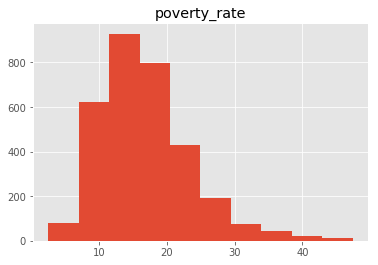

In [532]:
poverty_lb_raw = poverty_labels
hist_pov_lb = poverty_lb_raw.hist(column='poverty_rate')

Create one dataset by merging poverty_train and povert_labels. This is necessary to do a good statistical exploration of the data.

In [533]:
poverty = pd.merge(poverty_train, poverty_labels, on='row_id')
poverty.shape

(3198, 35)

In [534]:
richest = poverty.sort_values(by='poverty_rate')[:5]
richest

,row_id,area__rucc,area__urban_influence,econ__economic_typology,econ__pct_civilian_labor,econ__pct_unemployment,econ__pct_uninsured_adults,econ__pct_uninsured_children,demo__pct_female,demo__pct_below_18_years_of_age,demo__pct_aged_65_years_and_older,demo__pct_hispanic,demo__pct_non_hispanic_african_american,demo__pct_non_hispanic_white,demo__pct_american_indian_or_alaskan_native,demo__pct_asian,demo__pct_adults_less_than_a_high_school_diploma,demo__pct_adults_with_high_school_diploma,demo__pct_adults_with_some_college,demo__pct_adults_bachelors_or_higher,demo__birth_rate_per_1k,demo__death_rate_per_1k,health__pct_adult_obesity,health__pct_adult_smoking,health__pct_diabetes,health__pct_low_birthweight,health__pct_excessive_drinking,health__pct_physical_inacticity,health__air_pollution_particulate_matter,health__homicides_per_100k,health__motor_vehicle_crash_deaths_per_100k,health__pop_per_dentist,health__pop_per_primary_care_physician,yr,poverty_rate
116,208,"Nonmetro - Completely rural or less than 2,500...",Noncore not adjacent to a metro/micro area and...,Recreation,0.783,0.117,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.026812,0.288977,0.322741,0.361470,8.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,b,2.5
2788,5479,Metro - Counties in metro areas of 1 million p...,Large-in a metro area with at least 1 million ...,Nonspecialized,0.581,0.033,0.086,0.038,0.509,0.248,0.110,0.099,0.035,0.738,0.000,0.093,0.019487,0.072821,0.112821,0.794872,13.0,6.0,0.264,NaN,0.099,0.078,NaN,0.229,13.0,NaN,17.82,339.0,330.0,b,3.1
1581,3151,"Nonmetro - Completely rural or less than 2,500...",Noncore not adjacent to a metro/micro area and...,Recreation,0.764,0.115,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.022066,0.287864,0.326981,0.363089,11.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,a,3.3
90,162,Metro - Counties in metro areas of 1 million p...,Large-in a metro area with at least 1 million ...,Nonspecialized,0.538,0.031,0.110,0.041,0.499,0.293,0.075,0.134,0.074,0.612,0.007,0.156,0.065327,0.139698,0.218090,0.576884,14.0,3.0,0.227,0.099,0.075,0.071,0.195,0.205,13.0,0.0,3.91,1660.0,1390.0,a,3.6
3039,5973,Metro - Counties in metro areas of 1 million p...,Large-in a metro area with at least 1 million ...,Nonspecialized,0.567,0.032,0.083,0.031,0.503,0.260,0.108,0.098,0.039,0.725,0.007,0.098,0.018627,0.087255,0.115686,0.778431,17.0,5.0,0.256,NaN,0.099,0.073,NaN,0.202,13.0,NaN,14.64,349.0,339.0,a,4.0


In [535]:
poorest = poverty.sort_values(by='poverty_rate', ascending=False)[:5]
poorest

,row_id,area__rucc,area__urban_influence,econ__economic_typology,econ__pct_civilian_labor,econ__pct_unemployment,econ__pct_uninsured_adults,econ__pct_uninsured_children,demo__pct_female,demo__pct_below_18_years_of_age,demo__pct_aged_65_years_and_older,demo__pct_hispanic,demo__pct_non_hispanic_african_american,demo__pct_non_hispanic_white,demo__pct_american_indian_or_alaskan_native,demo__pct_asian,demo__pct_adults_less_than_a_high_school_diploma,demo__pct_adults_with_high_school_diploma,demo__pct_adults_with_some_college,demo__pct_adults_bachelors_or_higher,demo__birth_rate_per_1k,demo__death_rate_per_1k,health__pct_adult_obesity,health__pct_adult_smoking,health__pct_diabetes,health__pct_low_birthweight,health__pct_excessive_drinking,health__pct_physical_inacticity,health__air_pollution_particulate_matter,health__homicides_per_100k,health__motor_vehicle_crash_deaths_per_100k,health__pop_per_dentist,health__pop_per_primary_care_physician,yr,poverty_rate
553,1084,"Nonmetro - Completely rural or less than 2,500...",Noncore adjacent to micro area and does not co...,Federal/State government-dependent,0.286,0.101,0.265,0.061,0.455,0.218,0.136,0.021,0.043,0.903,0.003,0.000,0.279397,0.405025,0.256281,0.059296,12.0,10.0,0.323,0.390,0.138,0.089,0.090,0.352,13.0,NaN,26.02,20179.0,3650.0,b,47.4
1059,2080,"Nonmetro - Completely rural or less than 2,500...",Noncore not adjacent to a metro/micro area and...,Farm-dependent,0.360,0.055,0.299,0.100,0.497,0.342,0.103,0.031,0.000,0.306,0.653,0.000,0.180377,0.338949,0.319128,0.161546,20.0,8.0,0.396,0.324,0.170,0.062,0.241,0.299,10.0,NaN,84.68,4210.0,NaN,a,47.0
2473,4863,"Nonmetro - Completely rural or less than 2,500...",Noncore adjacent to a small metro and does not...,Farm-dependent,0.352,0.053,0.277,0.094,0.502,0.368,0.071,0.036,0.002,0.233,0.720,0.000,0.139581,0.406780,0.317049,0.136590,11.0,7.0,0.444,0.338,0.147,0.071,0.223,0.297,10.0,NaN,NaN,NaN,NaN,a,46.3
2100,4183,"Nonmetro - Completely rural or less than 2,500...",Noncore adjacent to a large metro area,Nonspecialized,0.351,0.122,0.254,0.070,0.530,0.244,0.171,0.013,0.686,0.299,0.000,0.006,0.255721,0.377114,0.230846,0.136318,9.0,14.0,0.393,0.260,0.175,0.141,0.182,0.331,13.0,NaN,37.42,3639.0,5180.0,b,46.1
916,1802,"Nonmetro - Completely rural or less than 2,500...",Micropolitan adjacent to a small metro area,Nonspecialized,0.343,0.126,0.251,0.069,0.534,0.228,0.143,0.016,0.837,0.139,0.004,0.011,0.217435,0.294589,0.325651,0.162325,14.0,11.0,0.418,0.174,0.164,0.157,NaN,0.381,11.0,19.5,36.43,4619.0,3110.0,a,45.8


Just by eye balling the top five poorest and richest counties...

Furthermore we can start to develop an intuition that to differentiate between counties that have a low poverty rate and high poverty rate:
* econ__economic_typology 'Recreation' or 'Nonspecialized'.
* low percentage unemployement and high percentage of civilian labor.
* are higher educated
* have better healthcare

### Data Exploration and Visualization of Categorical Variables
Here we explore the prediction value of the categorical variables 'econ__economic_typology', 'area__urban_influence', 'area__rucc' and 'yr'. We use mostly boxplots and one way analysis of variance (ANOVA).

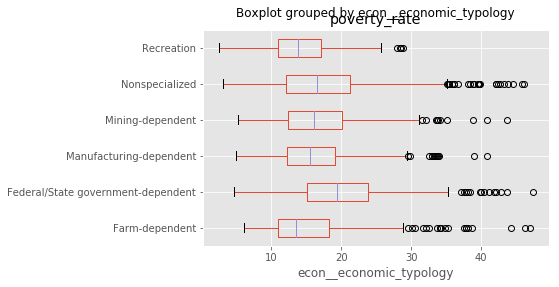

In [536]:
bpd_eet = poverty.boxplot(column='poverty_rate', by='econ__economic_typology', vert=False, return_type='dict')

There are alot more 'Nonspecialised' eets!

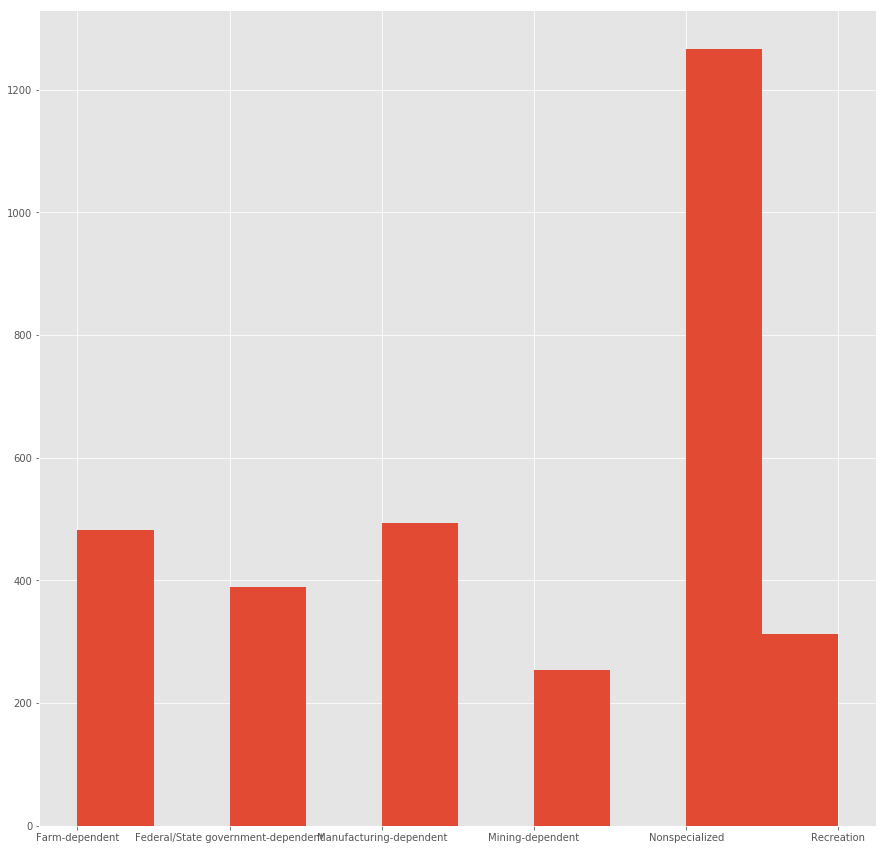

In [537]:
hb_eet = poverty.econ__economic_typology.hist(figsize=(15,15))

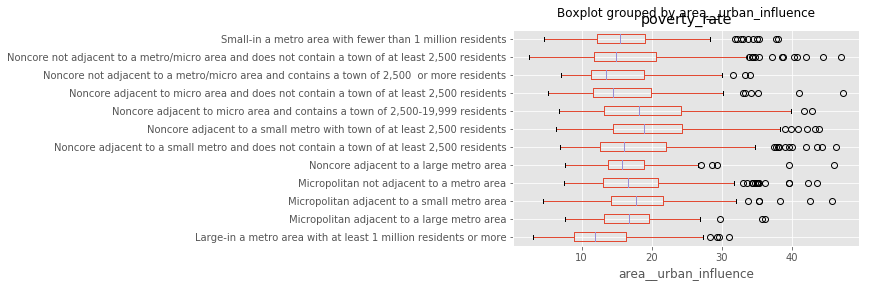

In [538]:
bpd_aui = poverty.boxplot(column='poverty_rate', by='area__urban_influence', vert=False, return_type='dict')

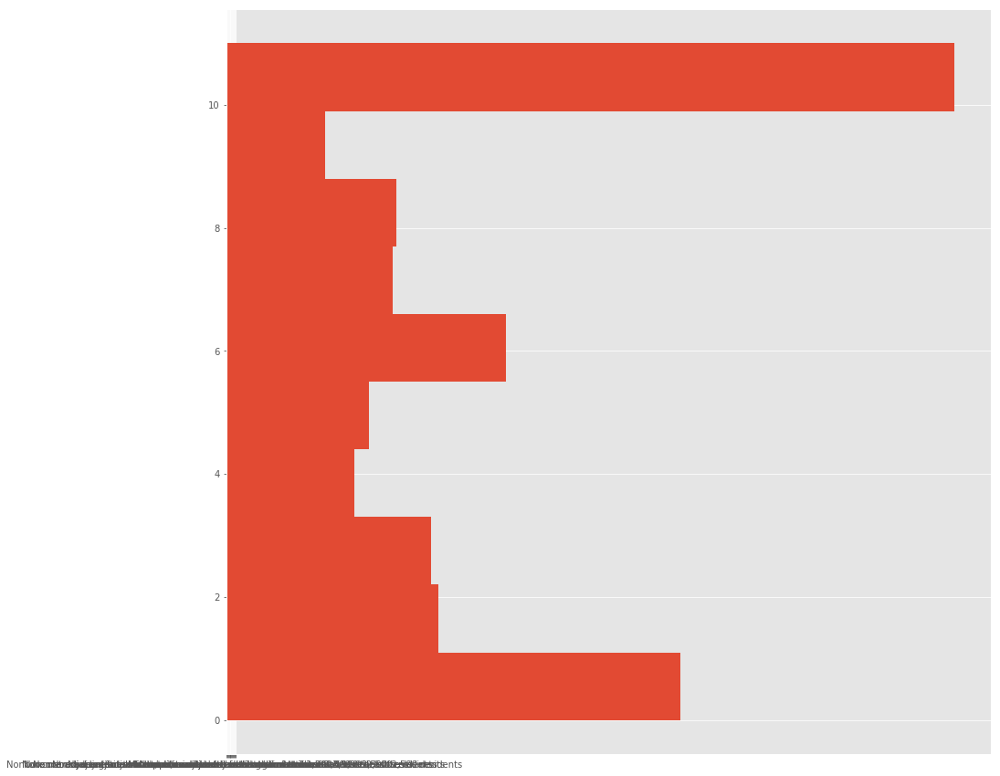

In [539]:
hb_rucc = poverty.area__urban_influence.hist(orientation='horizontal', figsize=(15,15))

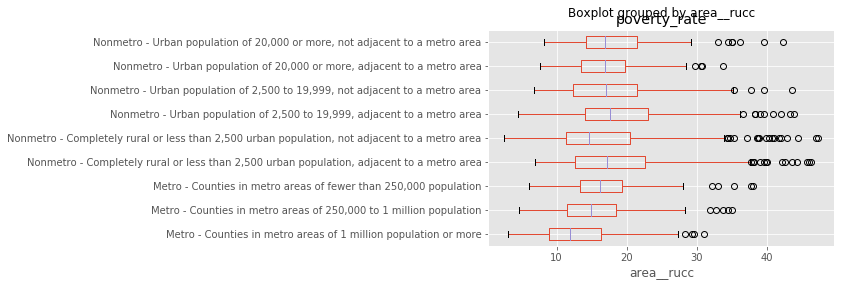

In [540]:
bpd_rucc = poverty.boxplot(column='poverty_rate', by='area__rucc', vert=False, return_type='dict')

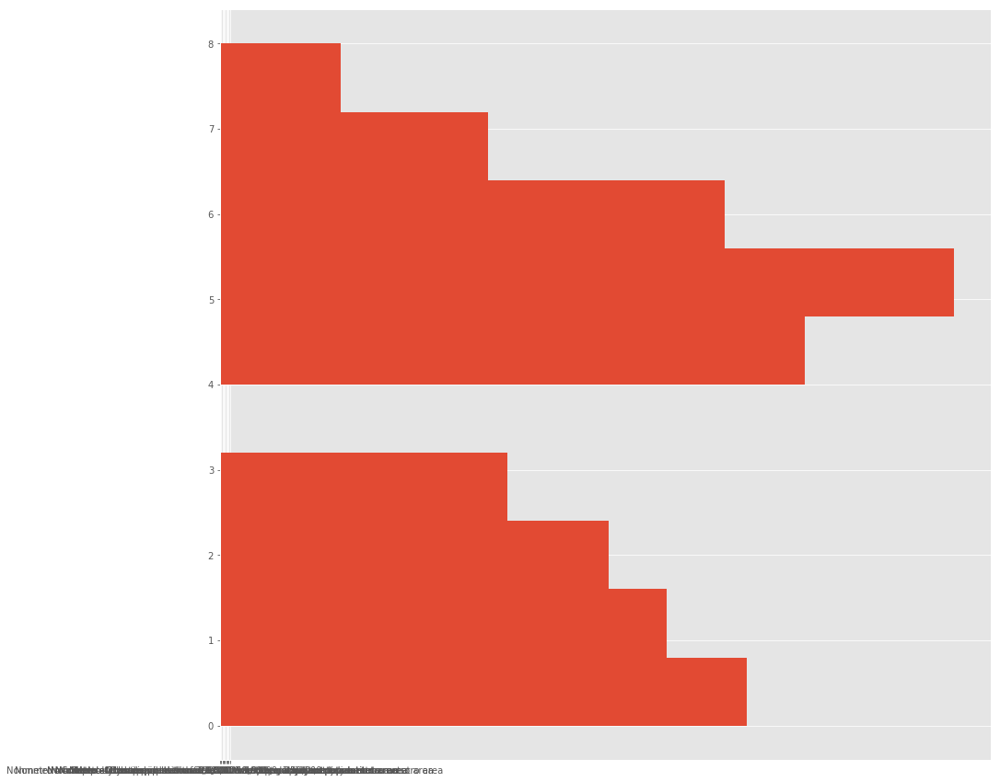

In [541]:
hb_area_rucc = poverty.area__rucc.hist(orientation='horizontal',figsize=(15,15))

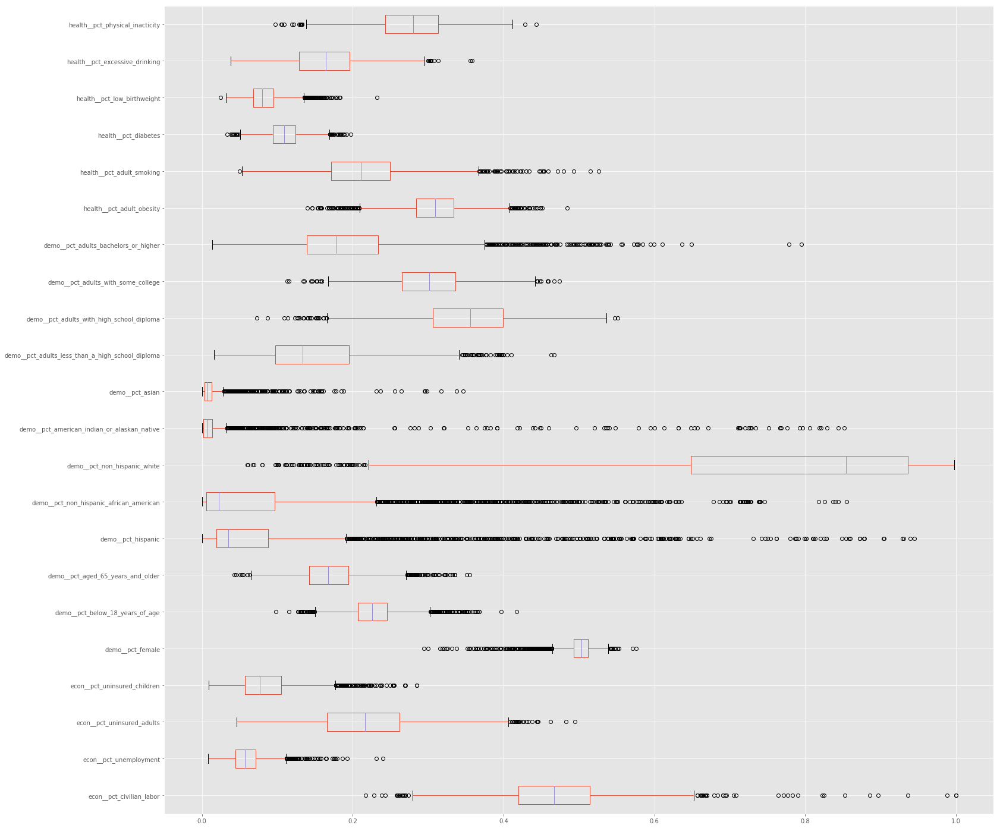

In [542]:
poverty_floats = poverty.loc[:, poverty.dtypes == np.float]
poverty_floats = poverty_floats.drop(columns=['poverty_rate','health__pop_per_primary_care_physician'
                                              , 'health__pop_per_dentist', 'health__motor_vehicle_crash_deaths_per_100k'
                                             , 'health__air_pollution_particulate_matter','demo__death_rate_per_1k'
                                             , 'demo__birth_rate_per_1k', 'health__homicides_per_100k'], axis=1)
poverty_floats.boxplot(figsize=(25,25), vert=False)

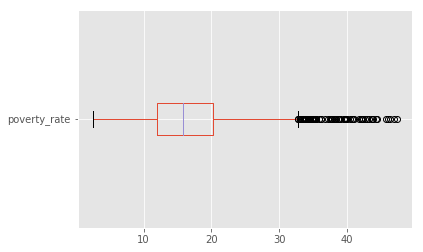

In [543]:
poverty[['poverty_rate']].boxplot(vert=False)

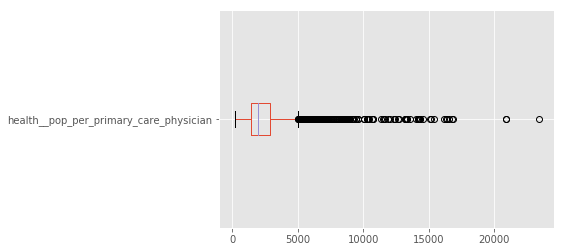

In [544]:
poverty[['health__pop_per_primary_care_physician']].boxplot(vert=False)

In [545]:
#creating new feature
# poverty_cp = poverty
# poverty_cp.loc[poverty_cp.health__pop_per_primary_care_physician > 5000,'health_pop_ppp'] = 'outliers'
# poverty_cp.loc[poverty_cp.health__pop_per_primary_care_physician < 5000,'health_pop_ppp'] = 'normal'
# poverty_cp.boxplot(column='poverty_rate', by='health_pop_ppp', vert=False, return_type='dict')

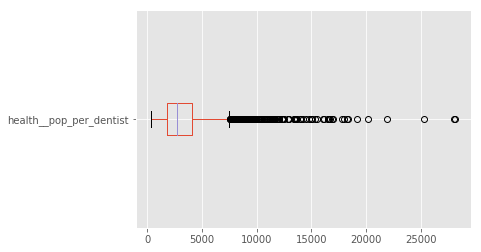

In [546]:
poverty[['health__pop_per_dentist']].boxplot(vert=False)

In [547]:
#creating new feature
# poverty_cp = poverty
# poverty_cp.loc[poverty_cp.health__pop_per_dentist > 7500,'health_pop_pd'] = 'outliers'
# poverty_cp.loc[poverty_cp.health__pop_per_dentist < 7500,'health_pop_pd'] = 'normal'
# poverty_cp.boxplot(column='poverty_rate', by='health_pop_pd', vert=False, return_type='dict')

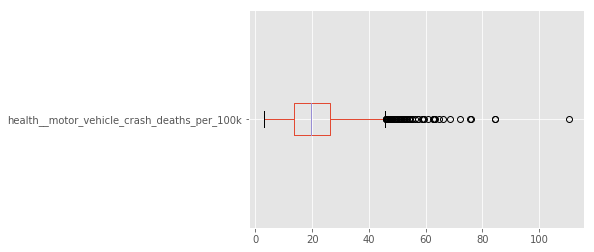

In [548]:
poverty[['health__motor_vehicle_crash_deaths_per_100k']].boxplot(vert=False)

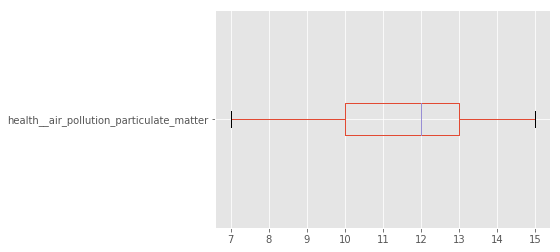

In [549]:
poverty[['health__air_pollution_particulate_matter']].boxplot(vert=False)

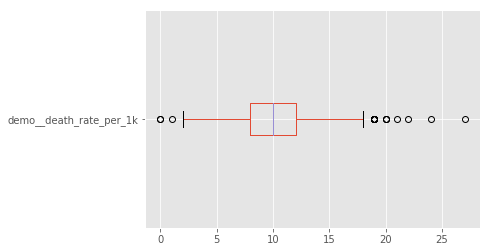

In [550]:
poverty[['demo__death_rate_per_1k']].boxplot(vert=False)

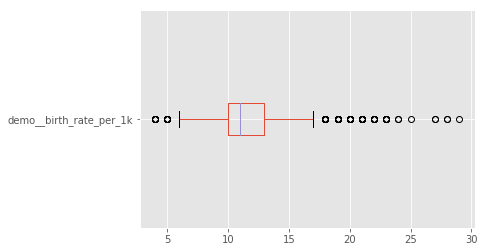

In [551]:
poverty[['demo__birth_rate_per_1k']].boxplot(vert=False)

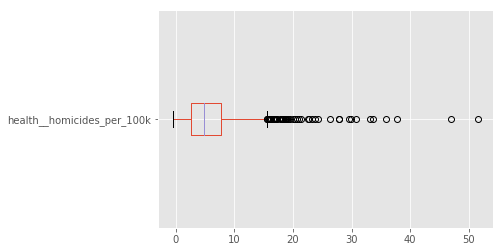

In [552]:
poverty[['health__homicides_per_100k']].boxplot(vert=False)

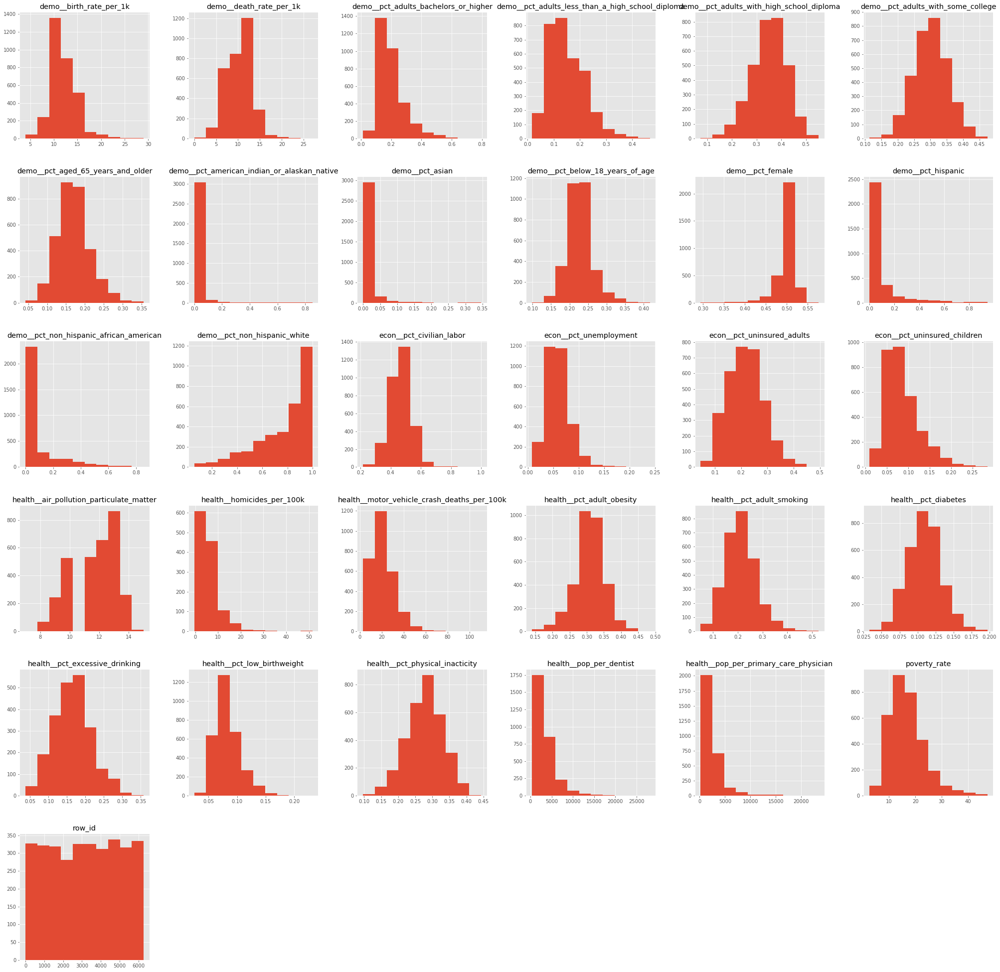

In [553]:
hist_pov = poverty.hist(figsize=(35,35))

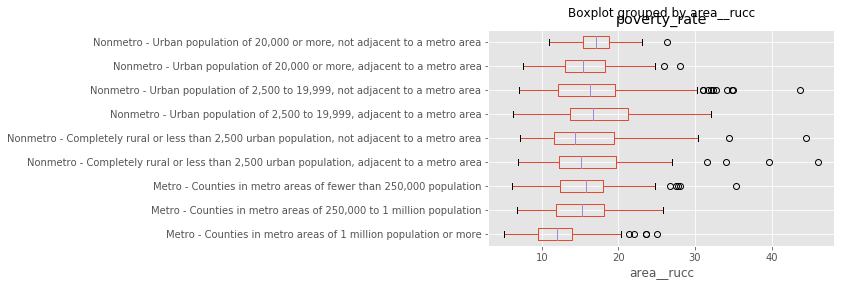

In [554]:
old_counties = poverty.demo__pct_aged_65_years_and_older > 0.167000
old_poor = poverty.loc[old_counties,:]
bpd_old = old_poor.boxplot(column='poverty_rate', by='area__rucc', vert=False, return_type='dict')

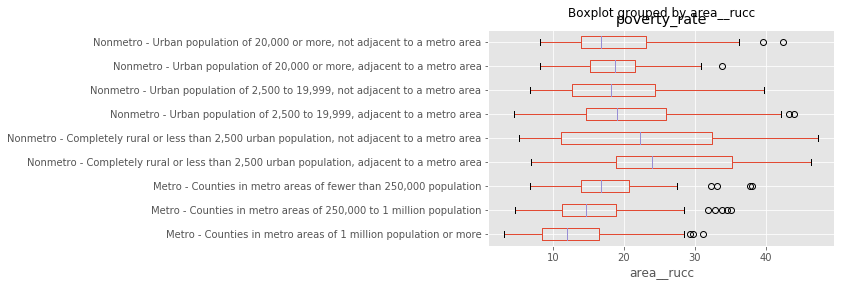

In [555]:
young_counties = poverty.demo__pct_aged_65_years_and_older < 0.167000
young_poor = poverty.loc[young_counties,:]
bpd_young = young_poor.boxplot(column='poverty_rate', by='area__rucc', vert=False, return_type='dict')

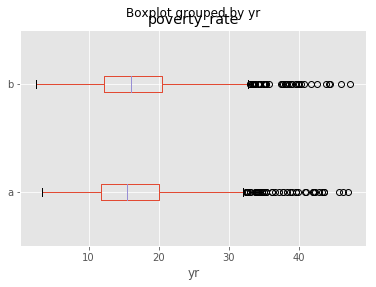

In [556]:
bpd_yr = poverty.boxplot(column='poverty_rate', by='yr', vert=False)

The categorical variable 'yr' does not hold any value to differentiate poverty rates. We will therefore drop it at the cleaning stage.

### Creation and Visualization of New Categorical Variables

In [557]:
def create_eet(input_df):
    input_df.loc[input_df.econ__economic_typology == 'Recreation','eet'] = 'Recreation/Farm'
    input_df.loc[input_df.econ__economic_typology == 'Nonspecialized','eet'] = 'Other EET'
    input_df.loc[input_df.econ__economic_typology == 'Mining-dependent','eet'] = 'Other EET'
    input_df.loc[input_df.econ__economic_typology == 'Manufacturing-dependent','eet'] = 'Other EET'
    input_df.loc[input_df.econ__economic_typology == 'Federal/State government-dependent','eet'] = 'Federal/State'
    input_df.loc[input_df.econ__economic_typology == 'Farm-dependent','eet'] = 'Recreation/Farm'
    return input_df

In [558]:
# poverty = create_eet(poverty)
# bpd_n_eet = poverty.boxplot(column='poverty_rate', by='eet', vert=False)

In [559]:
def create_aui(input_df):
    input_df.loc[input_df.area__urban_influence == 'Noncore adjacent to a large metro area','aui'] = 'Medium AUI'
    input_df.loc[input_df.area__urban_influence == 'Micropolitan adjacent to a large metro area','aui'] = 'Medium AUI'
    input_df.loc[input_df.area__urban_influence == 'Noncore adjacent to micro area and contains a town of 2,500-19,999 residents','aui'] ='High AUI'
    input_df.loc[input_df.area__urban_influence == 'Large-in a metro area with at least 1 million residents or more','aui'] = 'Low AUI'
    input_df.loc[input_df.area__urban_influence == 'Micropolitan not adjacent to a metro area','aui'] = 'Medium AUI'
    input_df.loc[input_df.area__urban_influence == 'Noncore not adjacent to a metro/micro area and does not contain a town of at least 2,500 residents','aui'] = 'Medium AUI'
    input_df.loc[input_df.area__urban_influence == 'Noncore adjacent to a small metro with town of at least 2,500 residents','aui'] = 'High AUI'
    input_df.loc[input_df.area__urban_influence == 'Small-in a metro area with fewer than 1 million residents','aui'] = 'Medium AUI'
    input_df.loc[input_df.area__urban_influence == 'Noncore adjacent to micro area and does not contain a town of at least 2,500 residents','aui'] = 'Medium AUI'
    input_df.loc[input_df.area__urban_influence == 'Noncore not adjacent to a metro/micro area and contains a town of 2,500  or more residents','aui'] = 'Medium AUI'
    input_df.loc[input_df.area__urban_influence == 'Noncore adjacent to a small metro and does not contain a town of at least 2,500 residents','aui'] = 'Medium AUI'
    input_df.loc[input_df.area__urban_influence == 'Micropolitan adjacent to a small metro area','aui'] = 'High AUI'
    return input_df

In [560]:
# poverty = create_aui(poverty)
# bpd_n_aui = poverty.boxplot(column='poverty_rate', by='aui', vert=False)

In [561]:
def create_rucc(input_df):
    input_df.loc[input_df.area__rucc == 'Nonmetro - Completely rural or less than 2,500 urban population, adjacent to a metro area','rucc'] = 'NonMetro'
    input_df.loc[input_df.area__rucc == 'Nonmetro - Urban population of 2,500 to 19,999, adjacent to a metro area','rucc'] ='NonMetro'
    input_df.loc[input_df.area__rucc == 'Nonmetro - Completely rural or less than 2,500 urban population, not adjacent to a metro area','rucc'] = 'NonMetro'
    input_df.loc[input_df.area__rucc == 'Nonmetro - Urban population of 2,500 to 19,999, not adjacent to a metro area','rucc'] ='NonMetro'
    input_df.loc[input_df.area__rucc == 'Metro - Counties in metro areas of 1 million population or more','rucc'] = 'Metro'
    input_df.loc[input_df.area__rucc == 'Metro - Counties in metro areas of 250,000 to 1 million population','rucc'] = 'Metro'
    input_df.loc[input_df.area__rucc == 'Nonmetro - Urban population of 20,000 or more, adjacent to a metro area','rucc'] = 'NonMetro'
    input_df.loc[input_df.area__rucc == 'Nonmetro - Urban population of 20,000 or more, not adjacent to a metro area','rucc'] = 'NonMetro'
    input_df.loc[input_df.area__rucc == 'Metro - Counties in metro areas of fewer than 250,000 population','rucc'] = 'Metro'
    return input_df

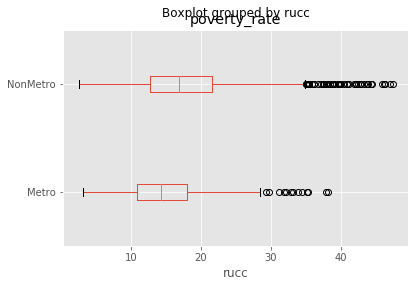

In [562]:
poverty = create_rucc(poverty)
bpd_n_rucc = poverty.boxplot(column='poverty_rate', by='rucc', vert=False)

The categorical variable age does not hold any value by itself.

In [563]:
# bpd_olds = poverty.boxplot(column=['demo__pct_aged_65_years_and_older'])

In [564]:
# def create_olds_cat(input_df):
#     low_olds = poverty.demo__pct_aged_65_years_and_older < 0.0575
#     medium_olds = (poverty.demo__pct_aged_65_years_and_older >= 0.0575) & (poverty.demo__pct_aged_65_years_and_older <= 0.26)
#     high_olds = poverty.demo__pct_aged_65_years_and_older > 0.26
#     input_df.loc[low_olds,'olds_cat'] = 'low_olds'
#     input_df.loc[medium_olds,'olds_cat'] = 'medium_olds'
#     input_df.loc[high_olds,'olds_cat'] = 'high_olds'
#     return input_df

In [565]:
# poverty = create_olds_cat(poverty)
# bpd_n_rucc = poverty.boxplot(column='poverty_rate', by=['rucc','olds_cat'], vert=False)

In [566]:
def create_young_age_cat(input_df):
    low_pct_youngs = poverty.demo__pct_below_18_years_of_age < 0.175
    medium_pct_youngs = (poverty.demo__pct_below_18_years_of_age >= 0.175) & (poverty.demo__pct_below_18_years_of_age <= 0.3)
    high_pct_youngs = poverty.demo__pct_below_18_years_of_age > 0.3
    input_df.loc[low_pct_youngs,'age_young_cat'] = 'low_youngs'
    input_df.loc[medium_pct_youngs,'age_young_cat'] = 'medium_youngs'
    input_df.loc[high_pct_youngs,'age_young_cat'] = 'high_youngs'
    return input_df

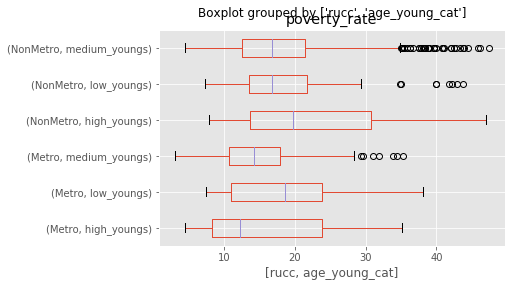

In [567]:
poverty = create_young_age_cat(poverty)
bpd_n_age = poverty.boxplot(column='poverty_rate', by=['rucc','age_young_cat'], vert=False)

In [568]:
# def create_young_age_cat(input_df):
#     low_pct_youngs = poverty.demo__pct_below_18_years_of_age < 0.226000
#     high_pct_youngs = poverty.demo__pct_below_18_years_of_age > 0.226000
#     input_df.loc[low_pct_youngs,'age_youngs_cat'] = 'low_youngs'
#     input_df.loc[high_pct_youngs,'age_youngs_cat'] = 'high_youngs'
#     return input_df

This feature is redundant and less informative than 'age_olds_cat'. We will therefore not include it.

In [569]:
# poverty = create_young_age_cat(poverty)
# bpd_n_age = poverty.boxplot(column='poverty_rate', by=['rucc','age_youngs_cat'], vert=False)

In [616]:
def create_old_age_cat(input_df):
    low_pct_olds = poverty.demo__pct_aged_65_years_and_older < 0.167000
    high_pct_olds = poverty.demo__pct_aged_65_years_and_older > 0.167000
    input_df.loc[low_pct_olds,'age_old_cat'] = 'low_olds'
    input_df.loc[high_pct_olds,'age_old_cat'] = 'high_olds'
    return input_df

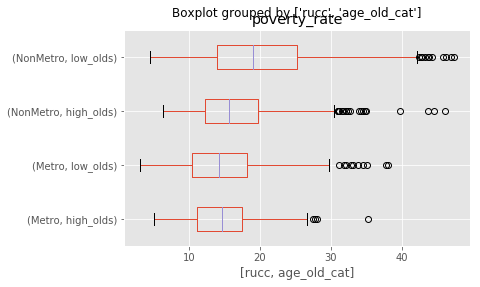

In [618]:
poverty = create_old_age_cat(poverty)
bpd_n_age = poverty.boxplot(column='poverty_rate', by=['rucc','age_old_cat'], vert=False)

In [572]:
def create_age_rucc(input_df, young_counties, old_counties):
    rucc_low = poverty.rucc == 'Low RUCC'
    rucc_high = poverty.rucc == 'High RUCC'
    input_df.loc[young_counties & rucc_low,'age_rucc'] = 'Young Low Poverty'
    input_df.loc[young_counties & rucc_high,'age_rucc'] = 'Young High Poverty'
    input_df.loc[old_counties & rucc_low,'age_rucc'] = 'Old Low Poverty'
    input_df.loc[old_counties & rucc_high,'age_rucc'] = 'Old High Poverty'
    return input_df

In [573]:
# poverty = create_age_rucc(poverty, young_counties, old_counties)
# bpd_n_age_rucc = poverty.boxplot(column='poverty_rate', by='age_rucc', vert=False)

### Data Exploration and Visualization of Quantitative Variables
We make several scatter plot matrics to visually explore the relationship between the quantitative variables and poverty_rate. Furthermore we look at the correlation matrix, to quantitavely visualize the correlation coefficients.

#### Correlation matrix
Compute the correlation matrix. Identify features with highest positive and negative pearson correlation coefficient. 

The features that correlate most positevely with poverty_rate (> 0.5):
* demo__pct_non_hispanic_african_american             0.507048
* health__pct_diabetes                                0.537038
* econ__pct_uninsured_adults                          0.541712
* health__pct_low_birthweight                         0.565456
* econ__pct_unemployment                              0.592022
* health__homicides_per_100k                          0.621399
* demo__pct_adults_less_than_a_high_school_diploma    0.680360

The features that correlate most negatively with poverty_rate (< - 0.5):
* econ__pct_civilian_labor                           -0.670417

In [574]:
corr_m = poverty.corr()
corr_m.sort_values(by='poverty_rate').loc[:,'poverty_rate']

econ__pct_civilian_labor                           -0.670417
demo__pct_non_hispanic_white                       -0.499974
demo__pct_adults_bachelors_or_higher               -0.467134
demo__pct_adults_with_some_college                 -0.363875
health__pct_excessive_drinking                     -0.353254
demo__pct_asian                                    -0.163033
demo__pct_aged_65_years_and_older                  -0.088123
demo__pct_female                                   -0.068065
row_id                                             -0.010522
demo__pct_below_18_years_of_age                     0.039237
health__air_pollution_particulate_matter            0.058582
econ__pct_uninsured_children                        0.098882
demo__pct_hispanic                                  0.105574
demo__birth_rate_per_1k                             0.127506
health__pop_per_primary_care_physician              0.156942
demo__pct_adults_with_high_school_diploma           0.202928
demo__pct_american_india

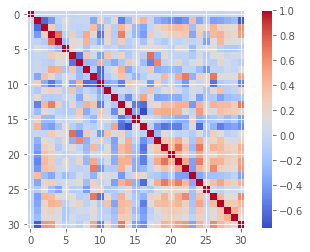

In [575]:
plt_corr = plt.imshow(poverty.corr(), cmap=plt.cm.coolwarm, interpolation='nearest')
plt_corr = plt.colorbar()

#### Scatter plot matrices

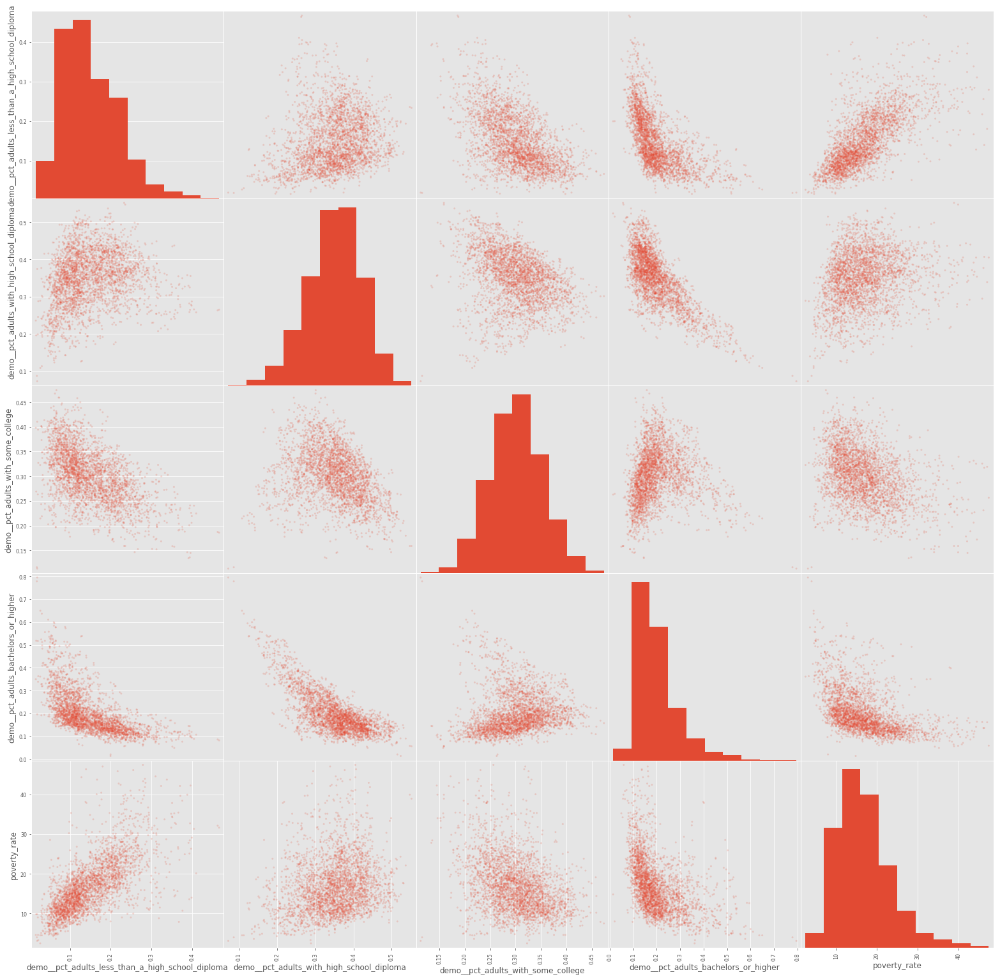

In [632]:
# demo__pct_adults_less_than_a_high_school_diploma    float64
# demo__pct_adults_with_high_school_diploma           float64
# demo__pct_adults_with_some_college                  float64
# demo__pct_adults_bachelors_or_higher                float64
scatter_educ = scatter_matrix(poverty.loc[:, ['demo__pct_adults_less_than_a_high_school_diploma','demo__pct_adults_with_high_school_diploma'
                                              ,'demo__pct_adults_with_some_college','demo__pct_adults_bachelors_or_higher'
                                              ,'poverty_rate']], alpha=0.2, figsize=(27, 27), diagonal='hist')

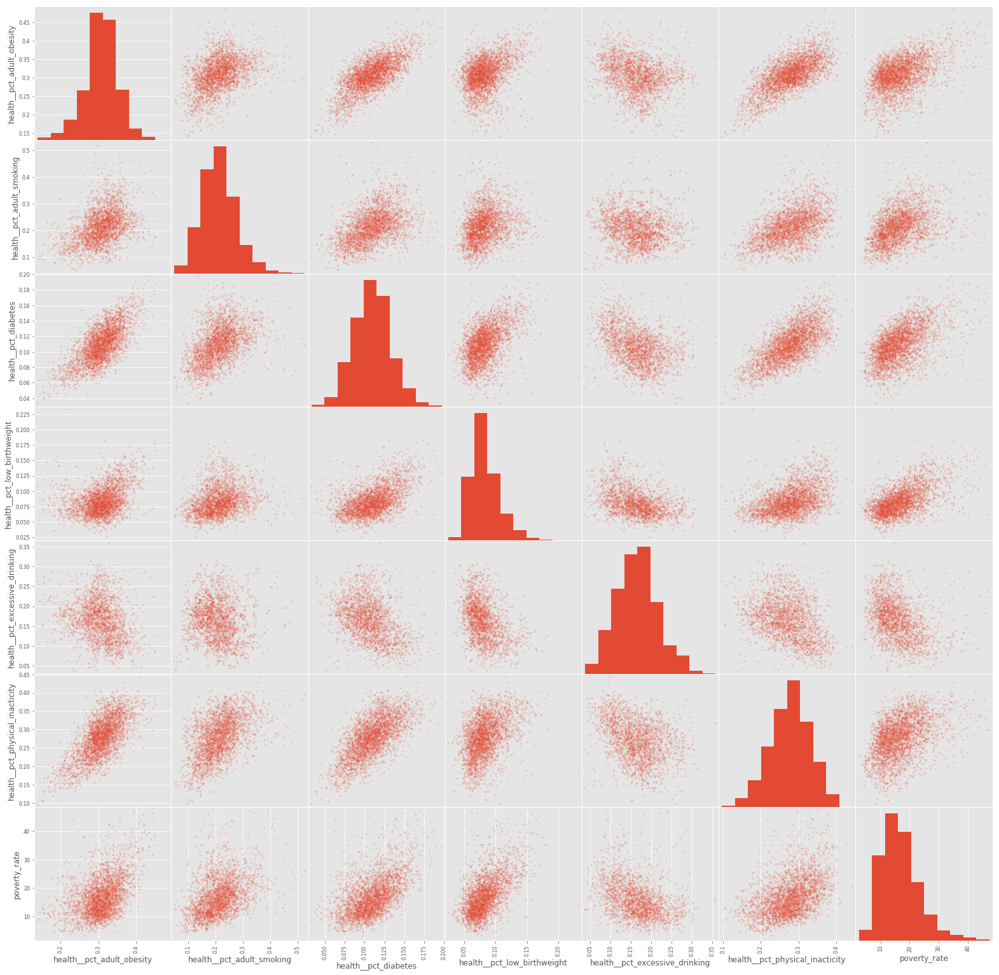

In [633]:
# health__pct_adult_obesity                           float64
# health__pct_adult_smoking                           float64
# health__pct_diabetes                                float64
# health__pct_low_birthweight                         float64
# health__pct_excessive_drinking                      float64
# health__pct_physical_inacticity                     float64
scatter_health1 = scatter_matrix(poverty.loc[:, ['health__pct_adult_obesity','health__pct_adult_smoking'
                                              ,'health__pct_diabetes','health__pct_low_birthweight'
                                              ,'health__pct_excessive_drinking','health__pct_physical_inacticity'
                                              ,'poverty_rate']], alpha=0.2, figsize=(27, 27), diagonal='hist')

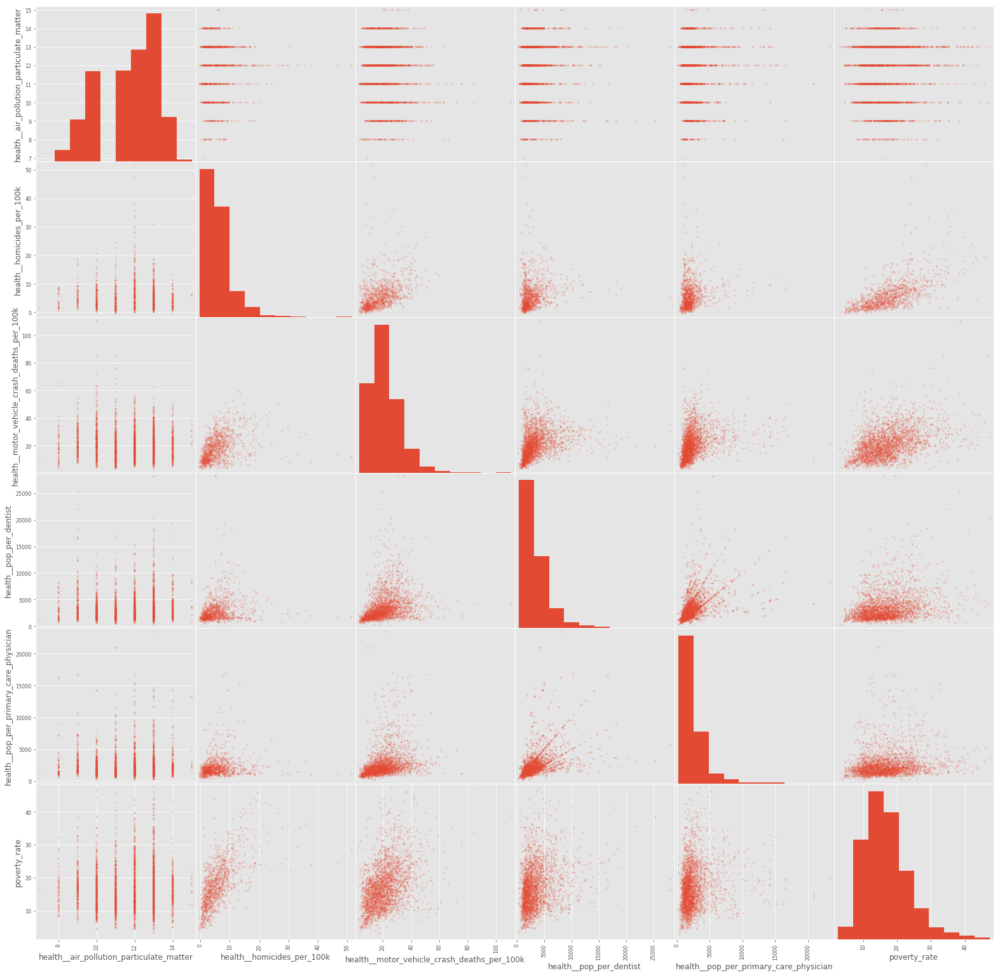

In [634]:
# health__air_pollution_particulate_matter            float64
# health__homicides_per_100k                          float64
# health__motor_vehicle_crash_deaths_per_100k         float64
# health__pop_per_dentist                             float64
# health__pop_per_primary_care_physician              float64
scatter_health1 = scatter_matrix(poverty.loc[:, ['health__air_pollution_particulate_matter','health__homicides_per_100k'
                                              ,'health__motor_vehicle_crash_deaths_per_100k','health__pop_per_dentist'
                                              ,'health__pop_per_primary_care_physician'
                                              ,'poverty_rate']], alpha=0.2, figsize=(27, 27), diagonal='hist')

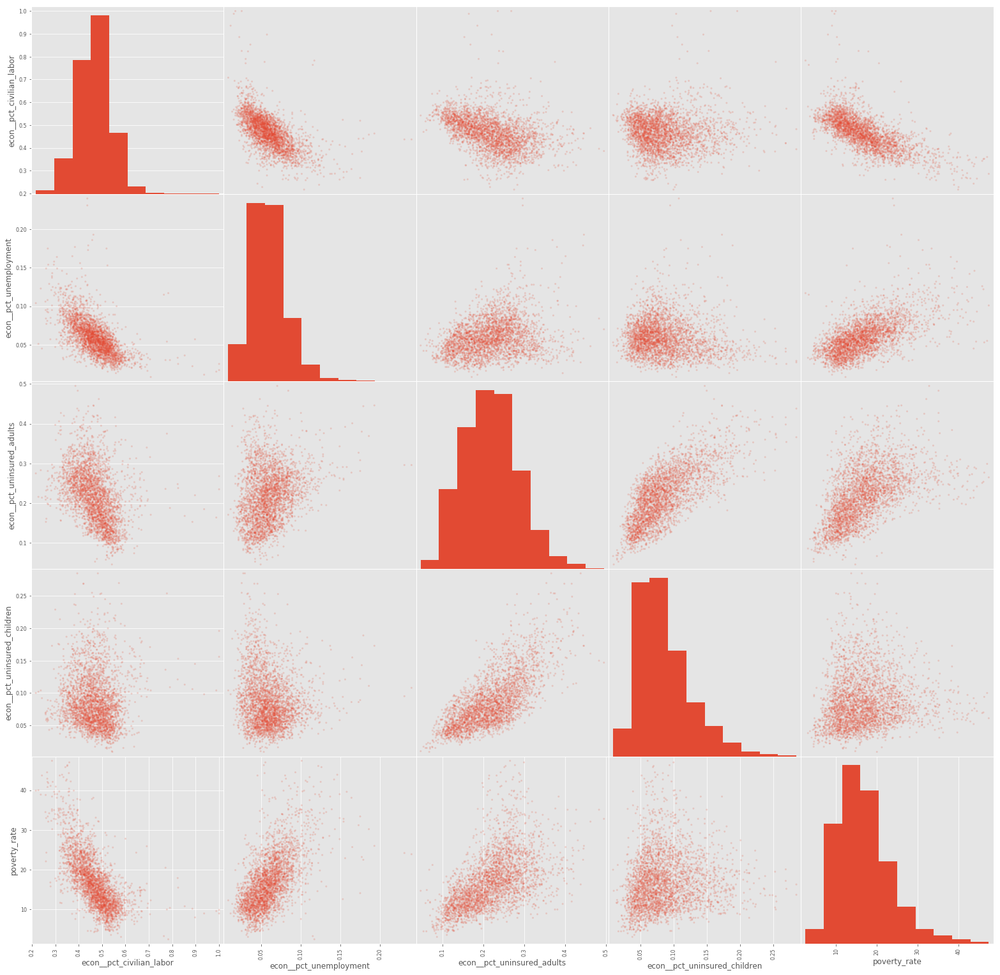

In [638]:
# econ__pct_civilian_labor                            float64
# econ__pct_unemployment                              float64
# econ__pct_uninsured_adults                          float64
# econ__pct_uninsured_children                        float64
scatter_econ = scatter_matrix(poverty.loc[:, ['econ__pct_civilian_labor','econ__pct_unemployment'
                                              ,'econ__pct_uninsured_adults','econ__pct_uninsured_children'
                                              ,'poverty_rate']], alpha=0.2, figsize=(27, 27), diagonal='hist')

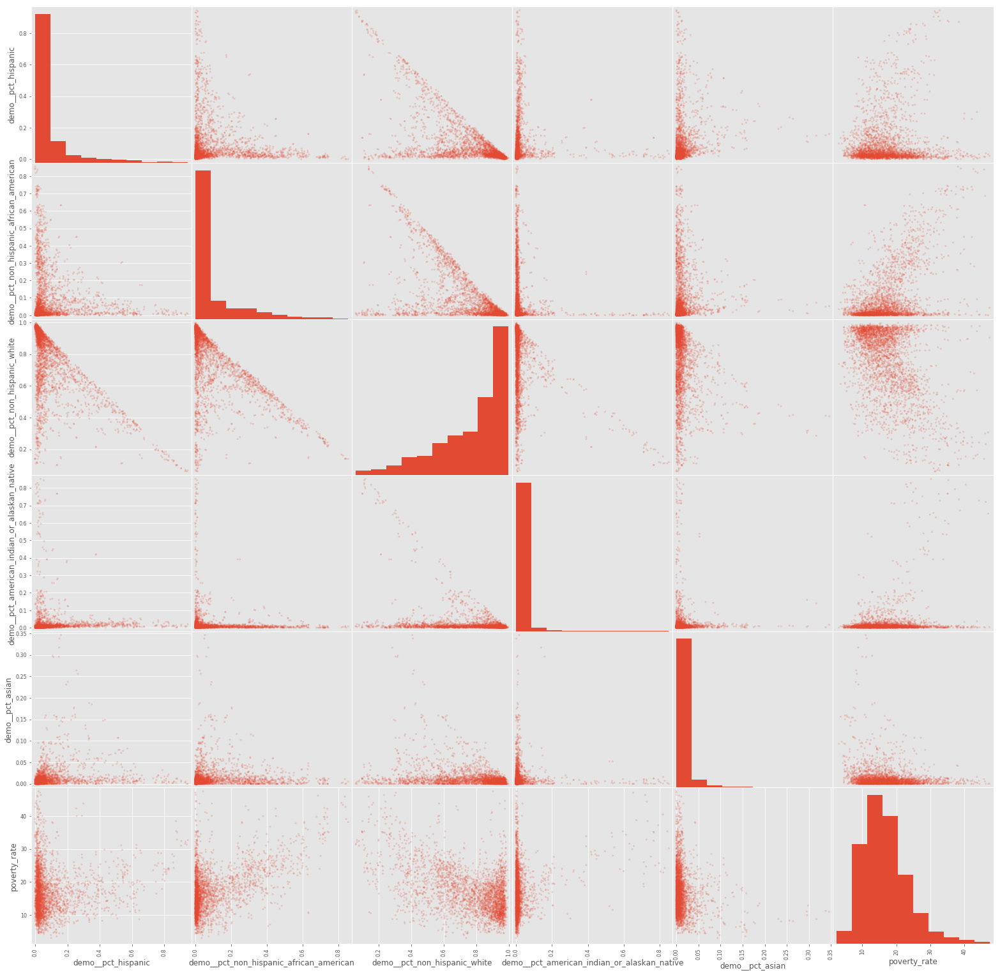

In [639]:
# demo__pct_hispanic                                  float64
# demo__pct_non_hispanic_african_american             float64
# demo__pct_non_hispanic_white                        float64
# demo__pct_american_indian_or_alaskan_native         float64
# demo__pct_asian
scatter_ethnic = scatter_matrix(poverty.loc[:, ['demo__pct_hispanic','demo__pct_non_hispanic_african_american'
                                              ,'demo__pct_non_hispanic_white','demo__pct_american_indian_or_alaskan_native'
                                              ,'demo__pct_asian'
                                              ,'poverty_rate']], alpha=0.2, figsize=(27, 27), diagonal='hist')

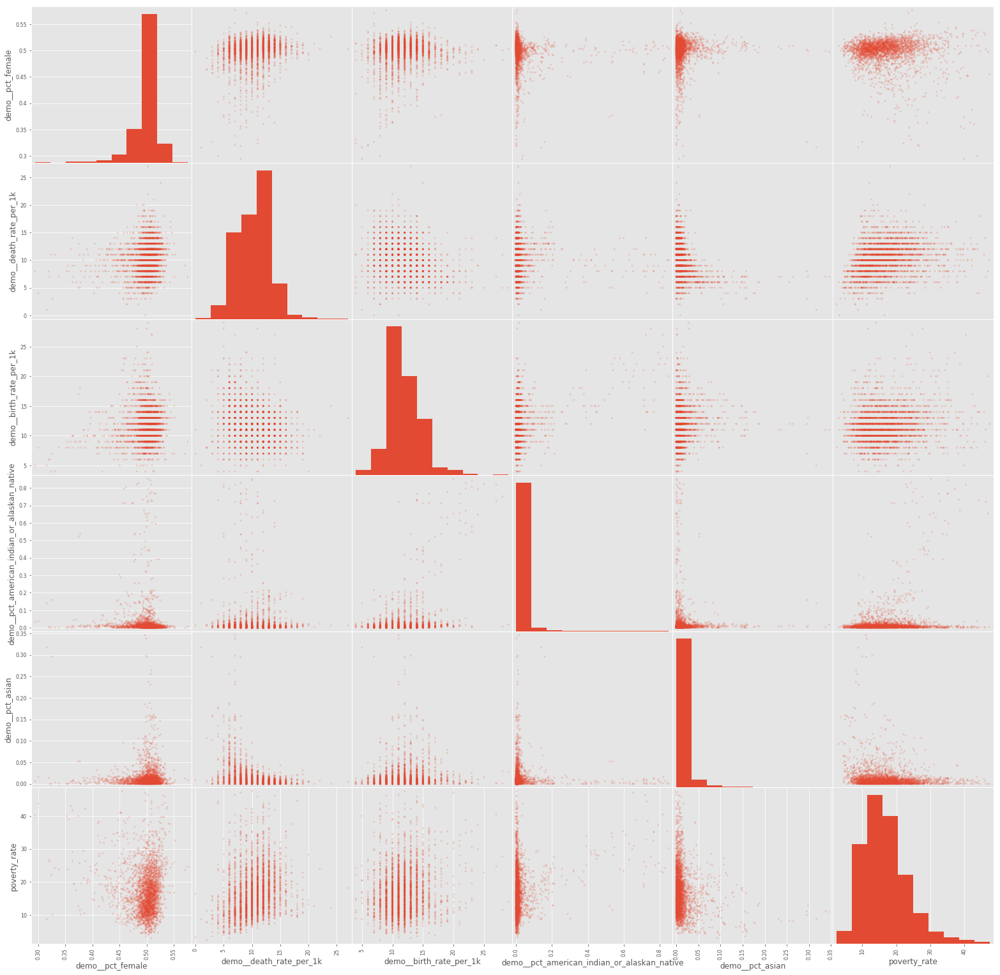

In [640]:
# demo__birth_rate_per_1k                             float64
# demo__death_rate_per_1k                             float64
# demo__pct_female
scatter_other = scatter_matrix(poverty.loc[:, ['demo__pct_female','demo__death_rate_per_1k'
                                              ,'demo__birth_rate_per_1k','demo__pct_american_indian_or_alaskan_native'
                                              ,'demo__pct_asian'
                                              ,'poverty_rate']], alpha=0.2, figsize=(27, 27), diagonal='hist')

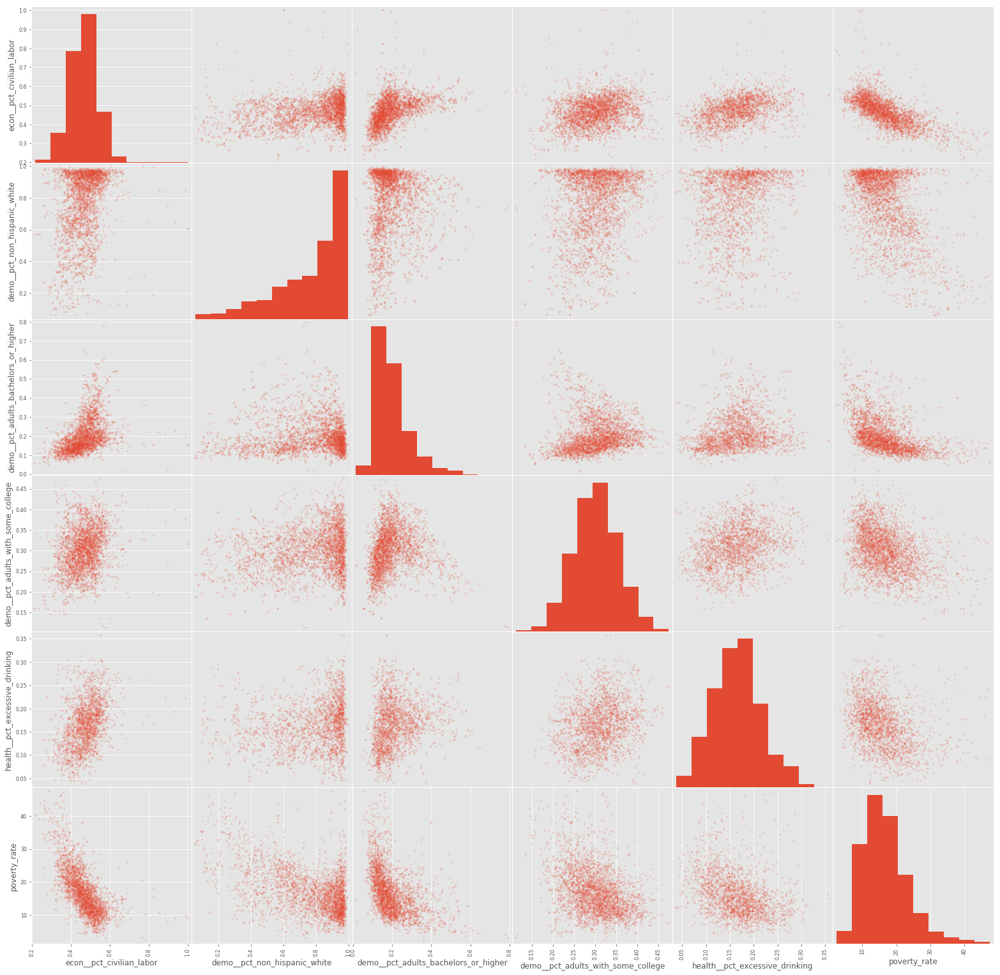

In [576]:
scatter_top_neg = scatter_matrix(poverty.loc[:, ['econ__pct_civilian_labor','demo__pct_non_hispanic_white'
                                              ,'demo__pct_adults_bachelors_or_higher','demo__pct_adults_with_some_college'
                                              ,'health__pct_excessive_drinking'
                                              ,'poverty_rate']], alpha=0.2, figsize=(27, 27), diagonal='hist')

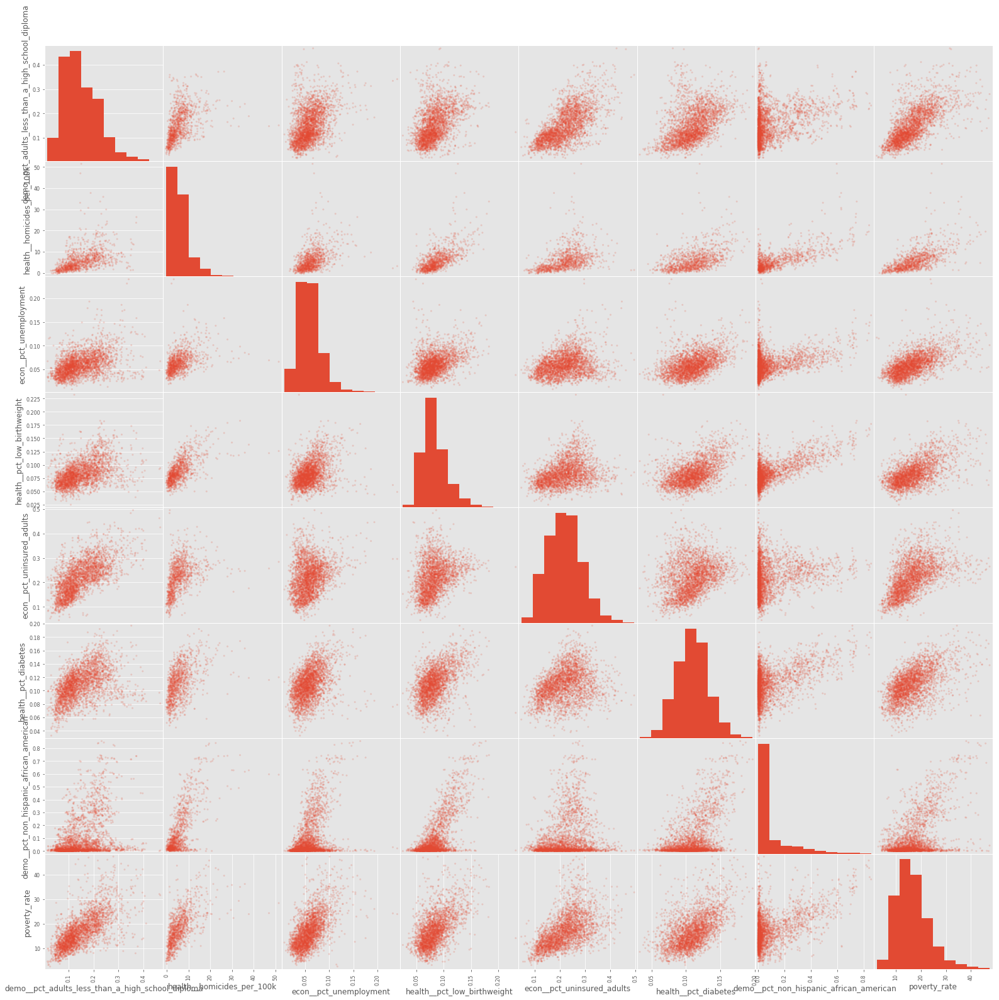

In [577]:
scatter_top_pos = scatter_matrix(poverty.loc[:, ['demo__pct_adults_less_than_a_high_school_diploma','health__homicides_per_100k'
                                              ,'econ__pct_unemployment','health__pct_low_birthweight'
                                              ,'econ__pct_uninsured_adults', 'health__pct_diabetes'
                                              , 'demo__pct_non_hispanic_african_american'
                                              ,'poverty_rate']], alpha=0.2, figsize=(27, 27), diagonal='hist')

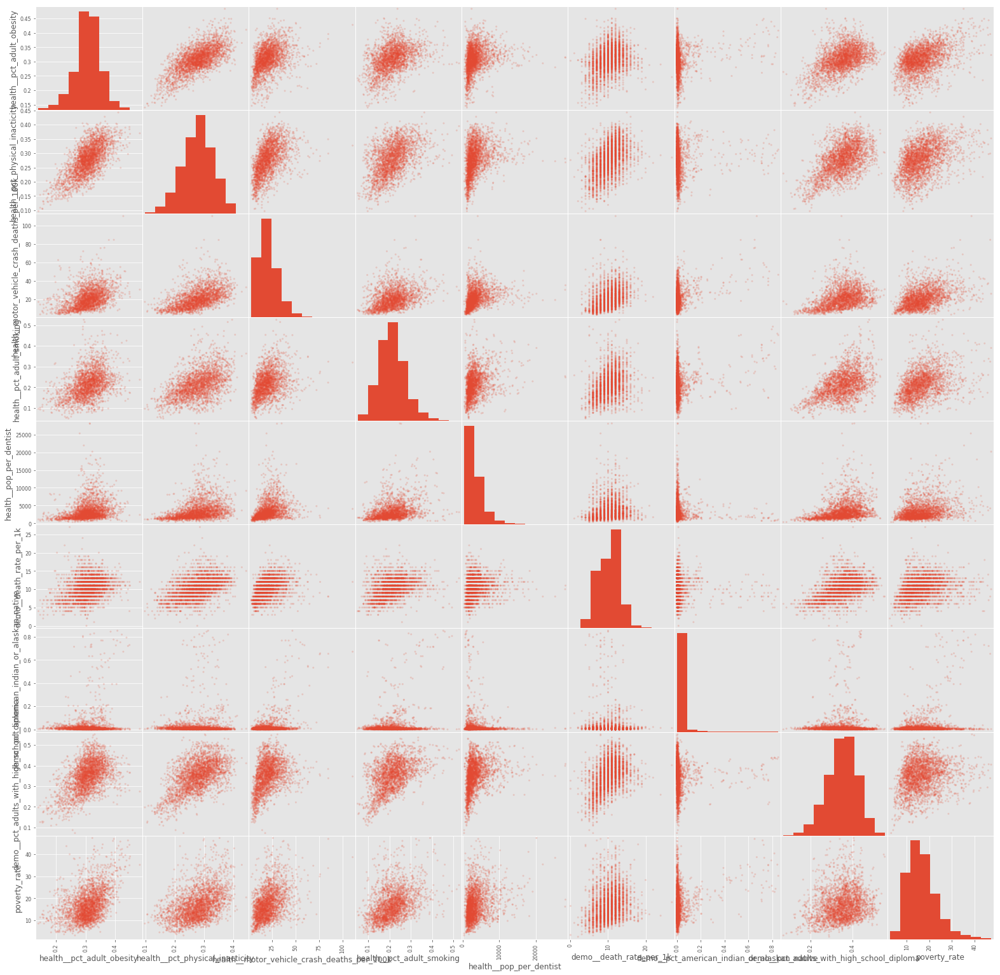

In [578]:
scatter_low_pos = scatter_matrix(poverty.loc[:, ['health__pct_adult_obesity', 'health__pct_physical_inacticity'
                                                ,'health__motor_vehicle_crash_deaths_per_100k', 'health__pct_adult_smoking'
                                                ,'health__pop_per_dentist','demo__death_rate_per_1k'
                                                ,'demo__pct_american_indian_or_alaskan_native','demo__pct_adults_with_high_school_diploma'
                                                ,'poverty_rate']]
                                , alpha=0.2, figsize=(27, 27), diagonal='hist')

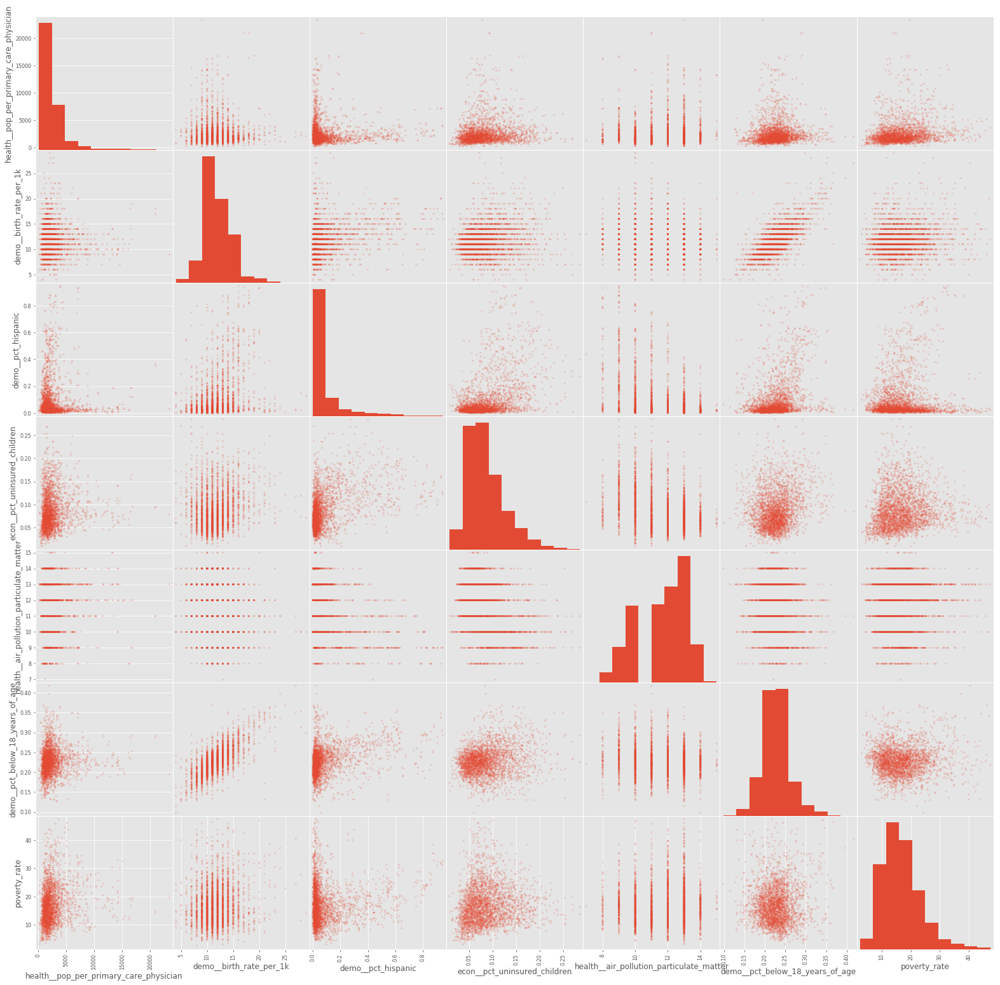

In [579]:
scatter_lowest_pos = scatter_matrix(poverty.loc[:, ['health__pop_per_primary_care_physician','demo__birth_rate_per_1k'
                                                    ,'demo__pct_hispanic','econ__pct_uninsured_children'
                                                    ,'health__air_pollution_particulate_matter', 'demo__pct_below_18_years_of_age'
                                                    ,'poverty_rate']], alpha=0.2, figsize=(27, 27), diagonal='hist')

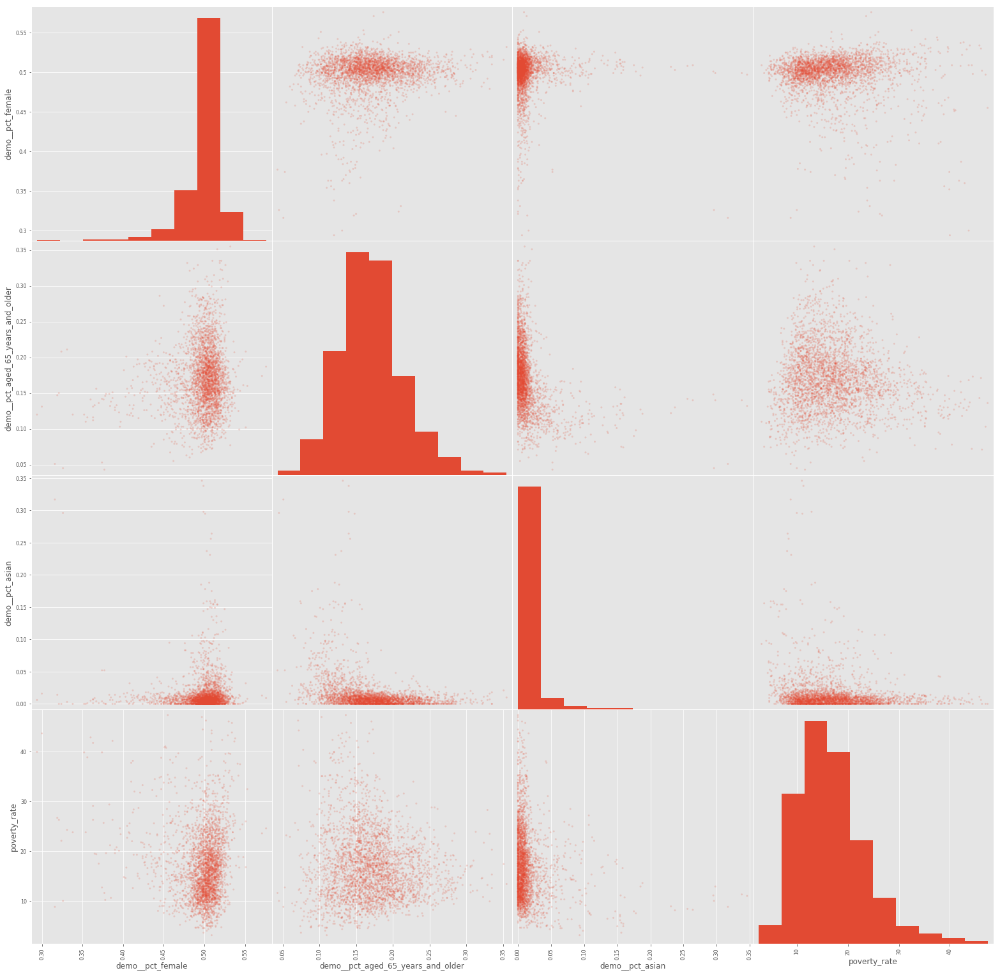

In [580]:
scatter_lowest_neg = scatter_matrix(poverty.loc[:, ['demo__pct_female','demo__pct_aged_65_years_and_older'
                                                    ,'demo__pct_asian'
                                                    ,'poverty_rate']], alpha=0.2, figsize=(27, 27), diagonal='hist')

In [581]:
poverty.health__air_pollution_particulate_matter.unique()

array([ 12.,  14.,  10.,  11.,  13.,   9.,   8.,  nan,  15.,   7.])

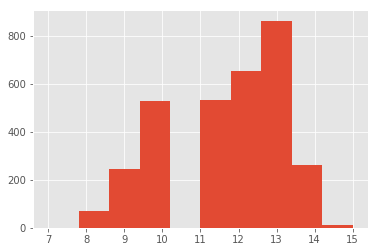

In [582]:
hist_air_poll = poverty.health__air_pollution_particulate_matter.hist()

In [583]:
poverty.demo__death_rate_per_1k.unique()

array([ 11.,  13.,   6.,  12.,   7.,  17.,  10.,   5.,   8.,   9.,  15.,
        16.,  14.,   3.,  19.,   2.,  20.,  18.,  21.,   4.,  27.,   1.,
        24.,   0.,  22.])

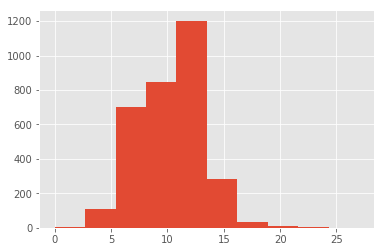

In [584]:
poverty.demo__death_rate_per_1k.hist()

### TODO Outliers Analysis!

## Cleaning the Data
In this phase or stage we clean the data:
* drop features with low prediction value
* replace missing values
* scale features???

### Drop columns
We will start by dropping the columns or features with low prediction value. The features 'area__rucc', 'age_cat', 'area__urban_influence', 'econ__economic_typology' and 'rucc' are redundant with the new features 'age_rucc', 'aui' and 'eet' we created. The feature 'yr' does not hold value to predict poverty_rate???????.

In [621]:
def drop_features(input_df):
    result_df = input_df.drop(columns=['yr','area__rucc','demo__pct_below_18_years_of_age'
                                      ,'demo__pct_aged_65_years_and_older'], axis=1)
#     result_df = input_df.drop(columns=['area__rucc','age_cat','area__urban_influence'
#                                 ,'econ__economic_typology','rucc','yr'], axis=1)
    return result_df

In [586]:
poverty_clean = drop_features(poverty)

### Convert feature to right type

In [587]:
def convert_to_cat(input_df):
#     input_df.loc[:,'eet'] = input_df.eet.astype("category")
#     input_df.loc[:,'aui'] = input_df.aui.astype("category")
#     input_df.loc[:,'age_rucc'] = input_df.age_rucc.astype("category")
    input_df.loc[:,'area__urban_influence'] = input_df.area__urban_influence.astype("category")
    input_df.loc[:,'rucc'] = input_df.rucc.astype("category")
    input_df.loc[:,'age_old_cat'] = input_df.age_old_cat.astype("category")
    input_df.loc[:,'age_young_cat'] = input_df.age_young_cat.astype("category")
    input_df.loc[:,'econ__economic_typology'] = input_df.econ__economic_typology.astype("category")
    return input_df

In [588]:
poverty_clean = convert_to_cat(poverty_clean)

In [589]:
poverty_clean.dtypes

row_id                                                 int64
area__urban_influence                               category
econ__economic_typology                             category
econ__pct_civilian_labor                             float64
econ__pct_unemployment                               float64
econ__pct_uninsured_adults                           float64
econ__pct_uninsured_children                         float64
demo__pct_female                                     float64
demo__pct_hispanic                                   float64
demo__pct_non_hispanic_african_american              float64
demo__pct_non_hispanic_white                         float64
demo__pct_american_indian_or_alaskan_native          float64
demo__pct_asian                                      float64
demo__pct_adults_less_than_a_high_school_diploma     float64
demo__pct_adults_with_high_school_diploma            float64
demo__pct_adults_with_some_college                   float64
demo__pct_adults_bachelo

### Apply SQRT Transformation

In [590]:
def apply_log10(input_df):
    float_df = input_df.loc[:, input_df.dtypes == np.float]
    float_df = float_df.replace(0,1)
    input_df.loc[:, input_df.dtypes == np.float] = np.log10(float_df)
    return input_df

def apply_pov_rate_sqrt(input_df):
    input_df.loc[:, 'poverty_rate'] = np.sqrt(input_df.loc[:, 'poverty_rate'])
    return input_df

In [591]:
# poverty_clean = apply_log10(poverty_clean)
# poverty_clean = apply_pov_rate_sqrt(poverty_clean)

### Replace Missing Values
The missing values are replaced by the respective median value of the feature or variable.

In [592]:
def clean_nans(input_df):
    result_df = input_df.fillna(poverty_clean.mean())
    return result_df

In [593]:
poverty_clean = clean_nans(poverty_clean)
poverty_clean.shape

(3198, 34)

As we can see here under there are no missing values.

In [594]:
poverty_clean.isnull().sum()

row_id                                              0
area__urban_influence                               0
econ__economic_typology                             0
econ__pct_civilian_labor                            0
econ__pct_unemployment                              0
econ__pct_uninsured_adults                          0
econ__pct_uninsured_children                        0
demo__pct_female                                    0
demo__pct_hispanic                                  0
demo__pct_non_hispanic_african_american             0
demo__pct_non_hispanic_white                        0
demo__pct_american_indian_or_alaskan_native         0
demo__pct_asian                                     0
demo__pct_adults_less_than_a_high_school_diploma    0
demo__pct_adults_with_high_school_diploma           0
demo__pct_adults_with_some_college                  0
demo__pct_adults_bachelors_or_higher                0
demo__birth_rate_per_1k                             0
demo__death_rate_per_1k     

### TODO Scale Features!!!
Most of the quantitative features are already scaled between 0 and 1. However the following features are not:
* **demo__birth_rate_per_1k** (behave like categorical variables)
* **demo__death_rate_per_1k** (behave like categorical variables)
* **health__air_pollution_particulate_matter** (behave like categorical variables)
* health__homicides_per_100k
* health__motor_vehicle_crash_deaths_per_100k
* health__pop_per_dentist
* health__pop_per_primary_care_physician

This is why we apply the MinMaxScaler

In [595]:
def scale_features(input_df):
    input_scale = input_df.loc[:,['demo__birth_rate_per_1k','demo__death_rate_per_1k'
                                    ,'health__air_pollution_particulate_matter','health__homicides_per_100k'
                                    ,'health__motor_vehicle_crash_deaths_per_100k','health__pop_per_dentist'
                                    ,'health__pop_per_primary_care_physician']]
    
    input_scaled = pd.DataFrame(MinMaxScaler().fit_transform(input_scale), columns=input_scale.columns)
    
    input_df.loc[:,'demo__birth_rate_per_1k'] = input_scaled.loc[:,'demo__birth_rate_per_1k']
    input_df.loc[:,'demo__death_rate_per_1k'] = input_scaled.loc[:,'demo__death_rate_per_1k']
    input_df.loc[:,'health__air_pollution_particulate_matter'] = input_scaled.loc[:,'health__air_pollution_particulate_matter']
    input_df.loc[:,'health__homicides_per_100k'] = input_scaled.loc[:,'health__homicides_per_100k']
    input_df.loc[:,'health__motor_vehicle_crash_deaths_per_100k'] = input_scaled.loc[:,'health__motor_vehicle_crash_deaths_per_100k']
    input_df.loc[:,'health__pop_per_dentist'] = input_scaled.loc[:,'health__pop_per_dentist']
    input_df.loc[:,'health__pop_per_primary_care_physician'] = input_scaled.loc[:,'health__pop_per_primary_care_physician']
    
    return input_df

In [596]:
poverty_clean = scale_features(poverty_clean)
poverty_clean.describe()

,row_id,econ__pct_civilian_labor,econ__pct_unemployment,econ__pct_uninsured_adults,econ__pct_uninsured_children,demo__pct_female,demo__pct_hispanic,demo__pct_non_hispanic_african_american,demo__pct_non_hispanic_white,demo__pct_american_indian_or_alaskan_native,demo__pct_asian,demo__pct_adults_less_than_a_high_school_diploma,demo__pct_adults_with_high_school_diploma,demo__pct_adults_with_some_college,demo__pct_adults_bachelors_or_higher,demo__birth_rate_per_1k,demo__death_rate_per_1k,health__pct_adult_obesity,health__pct_adult_smoking,health__pct_diabetes,health__pct_low_birthweight,health__pct_excessive_drinking,health__pct_physical_inacticity,health__air_pollution_particulate_matter,health__homicides_per_100k,health__motor_vehicle_crash_deaths_per_100k,health__pop_per_dentist,health__pop_per_primary_care_physician,poverty_rate
count,3198.000000,3198.000000,3198.00000,3198.000000,3198.000000,3198.000000,3198.000000,3198.000000,3198.000000,3198.000000,3198.000000,3198.000000,3198.000000,3198.000000,3198.000000,3198.000000,3198.000000,3198.000000,3198.000000,3198.000000,3198.000000,3198.000000,3198.000000,3198.000000,3198.000000,3198.000000,3198.000000,3198.000000,3198.000000
mean,3156.692620,0.467071,0.05961,0.217534,0.085920,0.498781,0.090233,0.091117,0.770207,0.024659,0.013304,0.148794,0.350300,0.301366,0.199540,0.307079,0.381523,0.307599,0.213519,0.109287,0.083534,0.164832,0.277309,0.578312,0.122219,0.167903,0.111279,0.101777,16.817136
std,1823.959278,0.074541,0.02285,0.067351,0.039992,0.024243,0.142663,0.147058,0.207838,0.084608,0.025358,0.068255,0.070534,0.052498,0.089158,0.109581,0.103190,0.043390,0.058333,0.023189,0.021736,0.041849,0.052931,0.192268,0.060537,0.091348,0.088861,0.087179,6.697969
min,0.000000,0.217000,0.00800,0.046000,0.009000,0.294000,0.000000,0.000000,0.060000,0.000000,0.000000,0.016129,0.072821,0.112821,0.013986,0.000000,0.000000,0.140000,0.050000,0.033000,0.025000,0.038000,0.097000,0.000000,0.000000,0.000000,0.000000,0.000000,2.500000
25%,1561.750000,0.420000,0.04400,0.166250,0.057000,0.493000,0.019000,0.006000,0.648250,0.002000,0.003000,0.097468,0.305915,0.265362,0.138840,0.240000,0.296296,0.284000,0.178000,0.094000,0.069000,0.146000,0.243000,0.375000,0.122219,0.106790,0.055416,0.054855,12.000000
50%,3198.500000,0.467000,0.05700,0.216000,0.077000,0.503000,0.035000,0.022000,0.854000,0.007000,0.007000,0.133501,0.355701,0.301595,0.177247,0.280000,0.370370,0.309000,0.213519,0.109000,0.081000,0.164832,0.280000,0.625000,0.122219,0.167903,0.090716,0.081901,15.800000
75%,4723.750000,0.514000,0.07100,0.262000,0.105000,0.512000,0.088000,0.096000,0.936000,0.014000,0.013000,0.195171,0.399197,0.335972,0.233258,0.360000,0.444444,0.334000,0.242000,0.124000,0.094000,0.182000,0.313000,0.750000,0.122219,0.207060,0.127771,0.110293,20.300000
max,6277.000000,1.000000,0.24000,0.495000,0.285000,0.576000,0.945000,0.855000,0.998000,0.852000,0.346000,0.466867,0.551689,0.474216,0.794872,1.000000,1.000000,0.484000,0.526000,0.197000,0.232000,0.358000,0.443000,1.000000,1.000000,1.000000,1.000000,1.000000,47.400000


### One Hot Encoding of Categorical Variables

In [597]:
def cat_to_dummies(input_df):
#     result_df = pd.get_dummies(input_df, dummy_na=True, columns=['age_rucc','aui','eet'])
    result_df = pd.get_dummies(input_df, dummy_na=True, columns=['area__urban_influence','econ__economic_typology'
                                                                 ,'rucc','age_young_cat','age_old_cat'])
    return result_df

In [598]:
poverty_clean = cat_to_dummies(poverty_clean)
poverty_clean.head()

,row_id,econ__pct_civilian_labor,econ__pct_unemployment,econ__pct_uninsured_adults,econ__pct_uninsured_children,demo__pct_female,demo__pct_hispanic,demo__pct_non_hispanic_african_american,demo__pct_non_hispanic_white,demo__pct_american_indian_or_alaskan_native,demo__pct_asian,demo__pct_adults_less_than_a_high_school_diploma,demo__pct_adults_with_high_school_diploma,demo__pct_adults_with_some_college,demo__pct_adults_bachelors_or_higher,demo__birth_rate_per_1k,demo__death_rate_per_1k,health__pct_adult_obesity,health__pct_adult_smoking,health__pct_diabetes,health__pct_low_birthweight,health__pct_excessive_drinking,health__pct_physical_inacticity,health__air_pollution_particulate_matter,health__homicides_per_100k,health__motor_vehicle_crash_deaths_per_100k,health__pop_per_dentist,health__pop_per_primary_care_physician,poverty_rate,area__urban_influence_Large-in a metro area with at least 1 million residents or more,area__urban_influence_Micropolitan adjacent to a large metro area,area__urban_influence_Micropolitan adjacent to a small metro area,area__urban_influence_Micropolitan not adjacent to a metro area,area__urban_influence_Noncore adjacent to a large metro area,"area__urban_influence_Noncore adjacent to a small metro and does not contain a town of at least 2,500 residents","area__urban_influence_Noncore adjacent to a small metro with town of at least 2,500 residents","area__urban_influence_Noncore adjacent to micro area and contains a town of 2,500-19,999 residents","area__urban_influence_Noncore adjacent to micro area and does not contain a town of at least 2,500 residents","area__urban_influence_Noncore not adjacent to a metro/micro area and contains a town of 2,500 or more residents","area__urban_influence_Noncore not adjacent to a metro/micro area and does not contain a town of at least 2,500 residents",area__urban_influence_Small-in a metro area with fewer than 1 million residents,area__urban_influence_nan,econ__economic_typology_Farm-dependent,econ__economic_typology_Federal/State government-dependent,econ__economic_typology_Manufacturing-dependent,econ__economic_typology_Mining-dependent,econ__economic_typology_Nonspecialized,econ__economic_typology_Recreation,econ__economic_typology_nan,rucc_Metro,rucc_NonMetro,rucc_nan,age_young_cat_high_youngs,age_young_cat_low_youngs,age_young_cat_medium_youngs,age_young_cat_nan,age_old_cat_high_olds,age_old_cat_low_olds,age_old_cat_nan
0,0,0.358,0.089,0.253,0.099,0.494,0.044,0.517,0.378,0.056,0.000,0.223896,0.345382,0.273092,0.157631,0.24,0.407407,0.345,0.219000,0.159,0.154,0.164832,0.317,0.625,0.187355,0.285581,0.183159,0.291241,22.6,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0
1,2,0.503,0.057,0.171,0.065,0.503,0.017,0.016,0.954,0.002,0.018,0.113524,0.484699,0.235933,0.165844,0.32,0.407407,0.296,0.222000,0.123,0.080,0.177000,0.350,0.875,0.047995,0.192996,0.097913,0.067210,17.3,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,1,0
2,4,0.471,0.070,0.297,0.122,0.497,0.554,0.002,0.428,0.009,0.008,0.236346,0.309831,0.315789,0.138034,0.24,0.407407,0.267,0.213519,0.092,0.079,0.164832,0.259,0.375,0.122219,0.167903,0.012630,0.101777,24.4,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0
3,5,0.578,0.049,0.231,0.107,0.474,0.031,0.002,0.916,0.043,0.002,0.091365,0.388554,0.349398,0.170683,0.12,0.481481,0.272,0.293000,0.084,0.100,0.174000,0.249,0.500,0.122219,0.186475,0.039259,0.041834,16.4,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0
4,8,0.530,0.046,0.262,0.067,0.513,0.433,0.096,0.294,0.011,0.149,0.171598,0.266272,0.190335,0.371795,0.44,0.222222,0.232,0.165000,0.080,0.086,0.178000,0.253,0.500,0.073053,0.005496,0.048974,0.072423,17.4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0


In [599]:
poverty_clean.dtypes

row_id                                                                                                                        int64
econ__pct_civilian_labor                                                                                                    float64
econ__pct_unemployment                                                                                                      float64
econ__pct_uninsured_adults                                                                                                  float64
econ__pct_uninsured_children                                                                                                float64
demo__pct_female                                                                                                            float64
demo__pct_hispanic                                                                                                          float64
demo__pct_non_hispanic_african_american                                     

In [600]:
poverty_clean.shape

(3198, 59)

## Model Building

In [601]:
rng = np.random.RandomState(0)

In [602]:
poverty_X = poverty_clean.drop(columns=['row_id','poverty_rate'], axis=1)
poverty_y = poverty_clean.poverty_rate

In [603]:
# use r2 adjusted in the future
scoring = {'r2':'r2','mse': make_scorer(mean_squared_error, greater_is_better=False)}

In [604]:
inner_cv = ShuffleSplit(n_splits=5, test_size=0.3, random_state=rng)
outer_cv = ShuffleSplit(n_splits=5, test_size=0.3, random_state=rng)

### AdaBoostRegressor

In [94]:
cachedir = mkdtemp()
estimators = [('reg_model', LinearRegression())]
regr_pipe = Pipeline(estimators, memory=cachedir)

In [628]:
#limit depth tree
#max_depth=20, n_estimators=50, splitter='best'
#max_depth=15, n_estimators=100, splitter='best', loss='exponential' (my belief)
#max_depth=40, n_estimators=200, splitter='random', loss='linear' (computer)
adaReg = AdaBoostRegressor(DecisionTreeRegressor(max_depth=15, splitter='random', criterion='mse'
                                                , min_samples_split=0.01, min_samples_leaf=0.005
                                                 , min_impurity_decrease=0.2)
                           , n_estimators=500, loss='exponential', learning_rate=0.75, random_state=rng)

In [629]:
param_grid = dict(reg_model=[LinearRegression(), adaReg])

In [630]:
reg_grid = GridSearchCV(estimator=regr_pipe, param_grid=param_grid, scoring=scoring, cv=inner_cv
                        , error_score=0, refit='mse')
reg_pred = reg_grid.fit(poverty_X, poverty_y)
reg_pred.best_estimator_

Pipeline(memory='/var/folders/_j/vyb4dyfx2wq850vj9vh25wy40000gn/T/tmpg61gewrg',
     steps=[('reg_model', AdaBoostRegressor(base_estimator=DecisionTreeRegressor(criterion='mse', max_depth=15, max_features=None,
           max_leaf_nodes=None, min_impurity_decrease=0.2,
           min_impurity_split=None, min_samples_leaf=0.0025,
           min_samples_split=0.01, min_weight_fraction...exponential', n_estimators=500,
         random_state=<mtrand.RandomState object at 0x1a26b36e10>))])

In [631]:
train_scores = cross_validate(reg_grid, poverty_X, poverty_y, cv=outer_cv, scoring=scoring, return_train_score=True)
pprint(np.average(np.abs(train_scores['test_r2'])))
pprint(np.average(np.sqrt(np.abs(train_scores['test_mse']))))

0.84306069520086768
2.6756110211842299


score1: 0.84164774625729666 and 2.632247532440791

### Feature Selection

In [212]:
mse = make_scorer(mean_squared_error, greater_is_better=False)

rfecv = RFECV(estimator=adaReg, step=1, cv=inner_cv, scoring=mse)

rfecv.fit(poverty_X, poverty_y)

print("Optimal number of features : %d" % rfecv.n_features_)

KeyboardInterrupt: 

In [ ]:
train_scores = cross_validate(rfecv, poverty_X, poverty_y, cv=outer_cv, scoring=scoring, return_train_score=True)
pprint(np.average(np.abs(train_scores['test_r2'])))
pprint(np.average(np.sqrt(np.abs(train_scores['test_mse']))))

score1: 

In [ ]:
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Cross validation score (nb of correct classifications)")
plt.plot(range(1, len(rfecv.grid_scores_) + 1), np.sqrt(np.abs(rfecv.grid_scores_)))
plt.show()

## TODO Analyze Residuals!!!

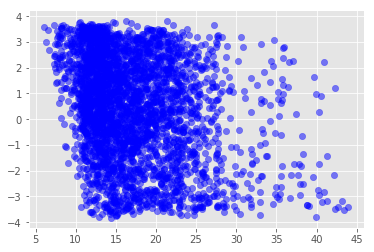

In [312]:
plt.scatter(reg_grid.predict(poverty_X), reg_grid.predict(poverty_X) - poverty_y, c='b', s=40, alpha=0.5)

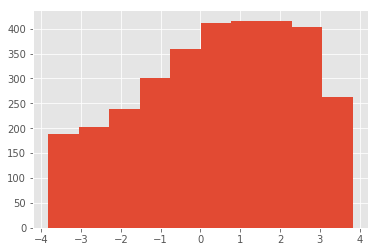

In [313]:
residuals = reg_grid.predict(poverty_X) - poverty_y
residuals = residuals.rename('residuals')
residuals.hist()

In [237]:
poverty_X_residuals = pd.concat([poverty_X, poverty.area__urban_influence, poverty.econ__economic_typology, poverty.area__rucc, poverty_y, residuals], axis=1)
poverty_X_high_res = poverty_X_residuals[(poverty_X_residuals.residuals > 7) | (poverty_X_residuals.residuals < -7)]
poverty_X_high_res.describe()

,econ__pct_civilian_labor,econ__pct_unemployment,econ__pct_uninsured_adults,econ__pct_uninsured_children,demo__pct_female,demo__pct_below_18_years_of_age,demo__pct_aged_65_years_and_older,demo__pct_hispanic,demo__pct_non_hispanic_african_american,demo__pct_non_hispanic_white,demo__pct_american_indian_or_alaskan_native,demo__pct_asian,demo__pct_adults_less_than_a_high_school_diploma,demo__pct_adults_with_high_school_diploma,demo__pct_adults_with_some_college,demo__pct_adults_bachelors_or_higher,demo__birth_rate_per_1k,demo__death_rate_per_1k,health__pct_adult_obesity,health__pct_adult_smoking,health__pct_diabetes,health__pct_low_birthweight,health__pct_excessive_drinking,health__pct_physical_inacticity,health__air_pollution_particulate_matter,health__homicides_per_100k,health__motor_vehicle_crash_deaths_per_100k,health__pop_per_dentist,health__pop_per_primary_care_physician,area__urban_influence_Large-in a metro area with at least 1 million residents or more,area__urban_influence_Micropolitan adjacent to a large metro area,area__urban_influence_Micropolitan adjacent to a small metro area,area__urban_influence_Micropolitan not adjacent to a metro area,area__urban_influence_Noncore adjacent to a large metro area,"area__urban_influence_Noncore adjacent to a small metro and does not contain a town of at least 2,500 residents","area__urban_influence_Noncore adjacent to a small metro with town of at least 2,500 residents","area__urban_influence_Noncore adjacent to micro area and contains a town of 2,500-19,999 residents","area__urban_influence_Noncore adjacent to micro area and does not contain a town of at least 2,500 residents","area__urban_influence_Noncore not adjacent to a metro/micro area and contains a town of 2,500 or more residents","area__urban_influence_Noncore not adjacent to a metro/micro area and does not contain a town of at least 2,500 residents",area__urban_influence_Small-in a metro area with fewer than 1 million residents,area__urban_influence_nan,econ__economic_typology_Farm-dependent,econ__economic_typology_Federal/State government-dependent,econ__economic_typology_Manufacturing-dependent,econ__economic_typology_Mining-dependent,econ__economic_typology_Nonspecialized,econ__economic_typology_Recreation,econ__economic_typology_nan,area__rucc_Metro - Counties in metro areas of 1 million population or more,"area__rucc_Metro - Counties in metro areas of 250,000 to 1 million population","area__rucc_Metro - Counties in metro areas of fewer than 250,000 population","area__rucc_Nonmetro - Completely rural or less than 2,500 urban population, adjacent to a metro area","area__rucc_Nonmetro - Completely rural or less than 2,500 urban population, not adjacent to a metro area","area__rucc_Nonmetro - Urban population of 2,500 to 19,999, adjacent to a metro area","area__rucc_Nonmetro - Urban population of 2,500 to 19,999, not adjacent to a metro area","area__rucc_Nonmetro - Urban population of 20,000 or more, adjacent to a metro area","area__rucc_Nonmetro - Urban population of 20,000 or more, not adjacent to a metro area",area__rucc_nan,poverty_rate,residuals
count,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

In [238]:
poverty_X_high_res.head()

,econ__pct_civilian_labor,econ__pct_unemployment,econ__pct_uninsured_adults,econ__pct_uninsured_children,demo__pct_female,demo__pct_below_18_years_of_age,demo__pct_aged_65_years_and_older,demo__pct_hispanic,demo__pct_non_hispanic_african_american,demo__pct_non_hispanic_white,demo__pct_american_indian_or_alaskan_native,demo__pct_asian,demo__pct_adults_less_than_a_high_school_diploma,demo__pct_adults_with_high_school_diploma,demo__pct_adults_with_some_college,demo__pct_adults_bachelors_or_higher,demo__birth_rate_per_1k,demo__death_rate_per_1k,health__pct_adult_obesity,health__pct_adult_smoking,health__pct_diabetes,health__pct_low_birthweight,health__pct_excessive_drinking,health__pct_physical_inacticity,health__air_pollution_particulate_matter,health__homicides_per_100k,health__motor_vehicle_crash_deaths_per_100k,health__pop_per_dentist,health__pop_per_primary_care_physician,area__urban_influence_Large-in a metro area with at least 1 million residents or more,area__urban_influence_Micropolitan adjacent to a large metro area,area__urban_influence_Micropolitan adjacent to a small metro area,area__urban_influence_Micropolitan not adjacent to a metro area,area__urban_influence_Noncore adjacent to a large metro area,"area__urban_influence_Noncore adjacent to a small metro and does not contain a town of at least 2,500 residents","area__urban_influence_Noncore adjacent to a small metro with town of at least 2,500 residents","area__urban_influence_Noncore adjacent to micro area and contains a town of 2,500-19,999 residents","area__urban_influence_Noncore adjacent to micro area and does not contain a town of at least 2,500 residents","area__urban_influence_Noncore not adjacent to a metro/micro area and contains a town of 2,500 or more residents","area__urban_influence_Noncore not adjacent to a metro/micro area and does not contain a town of at least 2,500 residents",area__urban_influence_Small-in a metro area with fewer than 1 million residents,area__urban_influence_nan,econ__economic_typology_Farm-dependent,econ__economic_typology_Federal/State government-dependent,econ__economic_typology_Manufacturing-dependent,econ__economic_typology_Mining-dependent,econ__economic_typology_Nonspecialized,econ__economic_typology_Recreation,econ__economic_typology_nan,area__rucc_Metro - Counties in metro areas of 1 million population or more,"area__rucc_Metro - Counties in metro areas of 250,000 to 1 million population","area__rucc_Metro - Counties in metro areas of fewer than 250,000 population","area__rucc_Nonmetro - Completely rural or less than 2,500 urban population, adjacent to a metro area","area__rucc_Nonmetro - Completely rural or less than 2,500 urban population, not adjacent to a metro area","area__rucc_Nonmetro - Urban population of 2,500 to 19,999, adjacent to a metro area","area__rucc_Nonmetro - Urban population of 2,500 to 19,999, not adjacent to a metro area","area__rucc_Nonmetro - Urban population of 20,000 or more, adjacent to a metro area","area__rucc_Nonmetro - Urban population of 20,000 or more, not adjacent to a metro area",area__rucc_nan,area__urban_influence,econ__economic_typology,area__rucc,poverty_rate,residuals


ValueError: not enough values to unpack (expected 2, got 0)

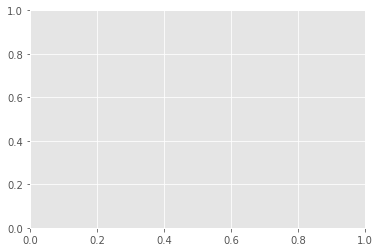

In [217]:
poverty_X_high_res.boxplot(column='residuals', by='area__urban_influence', vert=False)

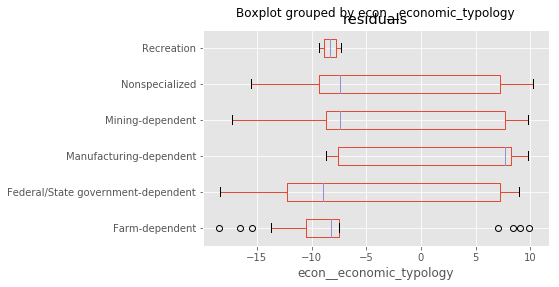

In [277]:
poverty_X_high_res.boxplot(column='residuals', by='econ__economic_typology', vert=False)

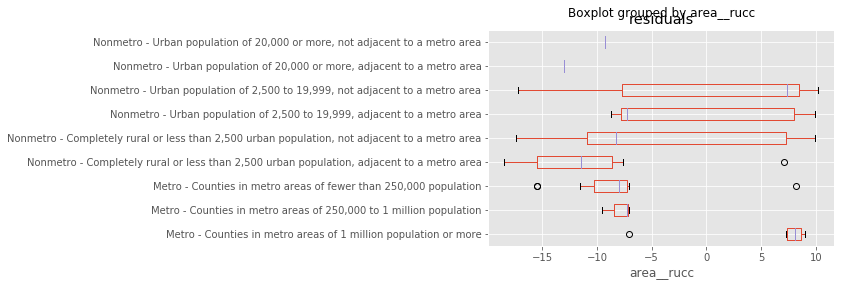

In [278]:
poverty_X_high_res.boxplot(column='residuals', by='area__rucc', vert=False)

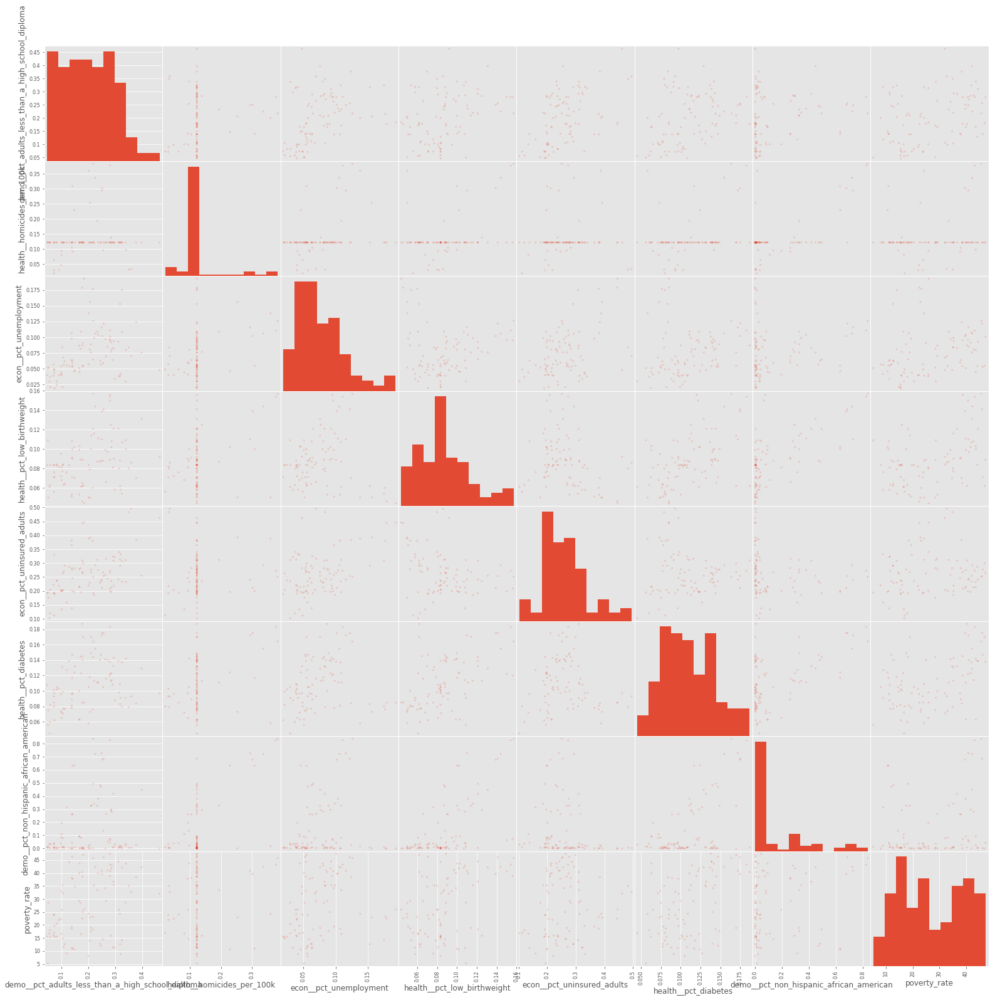

In [279]:
scatter_high_res_pos = scatter_matrix(poverty_X_high_res.loc[:, ['demo__pct_adults_less_than_a_high_school_diploma','health__homicides_per_100k'
                                              ,'econ__pct_unemployment','health__pct_low_birthweight'
                                              ,'econ__pct_uninsured_adults', 'health__pct_diabetes'
                                              , 'demo__pct_non_hispanic_african_american'
                                              ,'poverty_rate']], alpha=0.2, figsize=(27, 27), diagonal='hist')

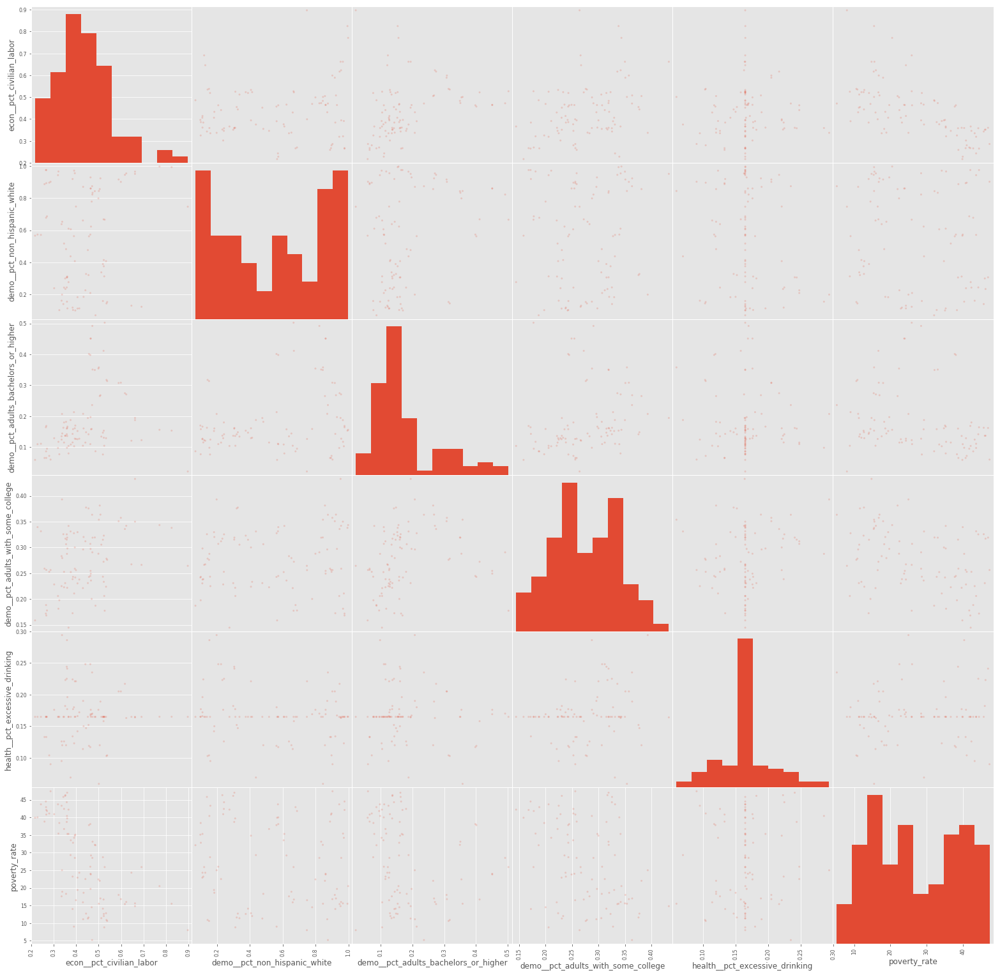

In [280]:
scatter_high_res__neg = scatter_matrix(poverty_X_high_res.loc[:, ['econ__pct_civilian_labor','demo__pct_non_hispanic_white'
                                              ,'demo__pct_adults_bachelors_or_higher','demo__pct_adults_with_some_college'
                                              ,'health__pct_excessive_drinking'
                                              ,'poverty_rate']], alpha=0.2, figsize=(27, 27), diagonal='hist')

## Evaluation

In [613]:
poverty_test = pd.read_csv('./Microsoft_-_DAT102x_Predicting_Poverty_in_the_United_States_-_Test_values.csv')

In [614]:
poverty_test.shape

(3080, 34)

In [622]:
#Create Features
poverty_test = create_rucc(poverty_test)
poverty_test = create_young_age_cat(poverty_test)
poverty_test = create_old_age_cat(poverty_test)
# poverty_test = create_eet(poverty_test)
# poverty_test = create_aui(poverty_test)
# poverty_test = create_age_cat(poverty_test, young_counties, old_counties)
# poverty_test = create_age_rucc(poverty_test, young_counties, old_counties)



#Convert to correct type
poverty_test = convert_to_cat(poverty_test)

#Drop Features
poverty_row_id = poverty_test.row_id
poverty_test = drop_features(poverty_test)
poverty_test = poverty_test.drop(columns=['row_id'], axis=1)
#Replace NANs
poverty_test_clean = poverty_test.fillna(poverty_test.mean())
poverty_test_clean = cat_to_dummies(poverty_test_clean)

#Scale Features
poverty_test_clean = scale_features(poverty_test_clean)

In [623]:
#Create Prediction
#Remember to remove or change np.square transformation
submission = pd.DataFrame(reg_grid.predict(poverty_test_clean))

In [624]:
poverty_submission = pd.concat([poverty_row_id, submission], axis=1)
poverty_submission = poverty_submission.rename(index=str, columns={0: 'poverty_rate'})
poverty_submission = poverty_submission.round({'poverty_rate':2})

In [625]:
poverty_submission.head()

,row_id,poverty_rate
0,1,18.76
1,3,17.06
2,6,14.05
3,7,27.21
4,14,15.63


In [626]:
poverty_submission.shape

(3080, 2)

In [627]:
poverty_submission.to_csv(path_or_buf='./MV_Poverty_Submission_AdaReg.csv', index=False)